In [ ]:
## 🔁 After Runtime Restart – Run These Cells In Order

1️⃣ Install dependencies
2️⃣ Import libraries
3️⃣ Load WSI
4️⃣ Generate tissue mask
5️⃣ Sample coords
6️⃣ Extract patches


SyntaxError: invalid character '️' (U+FE0F) (ipython-input-1961300351.py, line 3)

In [ ]:
print("Hello Colab, this is Wanlin")
import os

os.listdir("/content")



Hello Colab, this is Wanlin


['.config', 'drive', 'sample_data']

In [ ]:
# 安装 OpenSlide 系统库
!apt-get update -qq
!apt-get install -y openslide-tools

# 安装 Python bindings
!pip install openslide-python


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-5build1).
0 upgraded, 0 newly installed, 0 to remove and 50 not upgraded.


In [ ]:
import openslide

print(openslide.__version__)


1.4.3


In [ ]:
from PIL import Image
import tifffile
import numpy as np

# ✅ WSI 标准操作：允许超大图像
Image.MAX_IMAGE_PIXELS = None


class TiffWSI:
    """
    A minimal OpenSlide-like wrapper for pyramidal TIFFs.
    This is the missing engineering layer assumed by CellSAM.
    """

    def __init__(self, tiff_path: str):
        self.tiff_path = tiff_path
        self.tif = tifffile.TiffFile(tiff_path)

        # 每一页 = 一个 pyramid level
        self.level_count = len(self.tif.pages)

        # (width, height) per level
        self.level_dimensions = [
            (page.imagewidth, page.imagelength)
            for page in self.tif.pages
        ]

        # 下采样比例（相对于 level 0）
        w0, h0 = self.level_dimensions[0]
        self.level_downsamples = [
            w0 / w for (w, h) in self.level_dimensions
        ]

    def read_region(self, location, level, size):
        """
        Mimics OpenSlide.read_region
        location: (x, y) in level-0 coordinates
        level: pyramid level
        size: (width, height)
        """
        x, y = location
        w, h = size

        # 计算该 level 对应的坐标
        downsample = self.level_downsamples[level]
        x_l = int(x / downsample)
        y_l = int(y / downsample)

        # 读取该 level 的整页（tifffile 是 array）
        page = self.tif.pages[level].asarray()

        # 裁剪 patch
        patch = page[y_l:y_l + h, x_l:x_l + w]

        # 转成 PIL.Image（保持与你原 pipeline 一致）
        if patch.ndim == 2:
            return Image.fromarray(patch)
        else:
            return Image.fromarray(patch[:, :, :3])


In [38]:
wsi = TiffWSI("/content/DHMC_0039.tif")

print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)

# 试着取一个小 patch
patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)

print("Patch size:", patch.size)
patch


Level count: 9
Level 0 size: (47808, 30127)
Downsamples: [1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.17158176943698, 257.03225806451616]


ValueError: <COMPRESSION.JPEG: 7> requires the 'imagecodecs' package

In [ ]:
!pip install -U imagecodecs


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 127.9 MB/s eta 0:00:00


In [1]:
wsi = TiffWSI("/content/DHMC_0039.tif")

print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)

patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)

print("Patch size:", patch.size)
patch


NameError: name 'TiffWSI' is not defined

In [3]:
!pip install -U imagecodecs


In [1]:
import imagecodecs
print(imagecodecs.__version__)


2025.11.11


In [4]:
from tifffile import TiffFile
from PIL import Image

# 如果你之前定义过 TiffWSI，这里假设它还在
# 如果 TiffWSI 是你自己写的类，确保那一格也已经跑过

wsi = TiffWSI("/content/DHMC_0039.tif")

print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)


NameError: name 'TiffWSI' is not defined

In [6]:
class TiffWSI:
    def __init__(self, tiff_path):
        ...
    def read_region(self, location, level, size):
        ...


In [7]:
wsi = TiffWSI("/content/DHMC_0039.tif")


In [8]:
patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)
patch


In [9]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

img = Image.open("/content/DHMC_0039.tif")
print(img.size)


(47808, 30127)


In [10]:
wsi = TiffWSI("/content/DHMC_0039.tif")

print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)

patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)

patch


AttributeError: 'TiffWSI' object has no attribute 'level_count'

In [11]:
import numpy as np
import tifffile
from PIL import Image

class TiffWSI:
    def __init__(self, path):
        self.path = path
        self.tif = tifffile.TiffFile(path)
        self.pages = self.tif.pages

        # Level info
        self.level_count = len(self.pages)
        self.level_dimensions = [
            (page.imagewidth, page.imagelength)
            for page in self.pages
        ]

        w0, h0 = self.level_dimensions[0]
        self.level_downsamples = [
            w0 / w for (w, h) in self.level_dimensions
        ]

    def read_region(self, location, level, size):
        x, y = location
        w, h = size

        page = self.pages[level]
        img = page.asarray()

        patch = img[y:y+h, x:x+w]

        if patch.ndim == 2:  # grayscale
            patch = np.stack([patch]*3, axis=-1)

        return Image.fromarray(patch)


Level count: 9
Level 0 size: (47808, 30127)
Downsamples: [1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.17158176943698, 257.03225806451616]


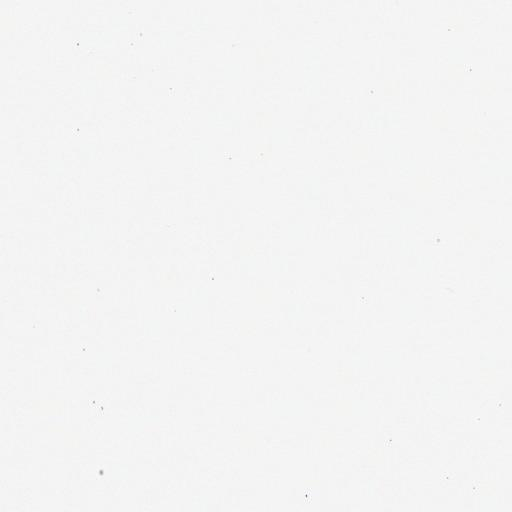

In [12]:
wsi = TiffWSI("/content/DHMC_0039.tif")

print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)

patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)

patch


In [13]:
# Step 1: 从高 downsample level 读整张图（thumbnail）

thumb_level = 6  # 你刚刚看到一共有 9 层，6~7 是合适的
thumb = wsi.read_region(
    location=(0, 0),
    level=thumb_level,
    size=wsi.level_dimensions[thumb_level]
)

plt.figure(figsize=(6, 6))
plt.imshow(thumb)
plt.axis("off")


NameError: name 'plt' is not defined

(np.float64(-0.5), np.float64(746.5), np.float64(469.5), np.float64(-0.5))

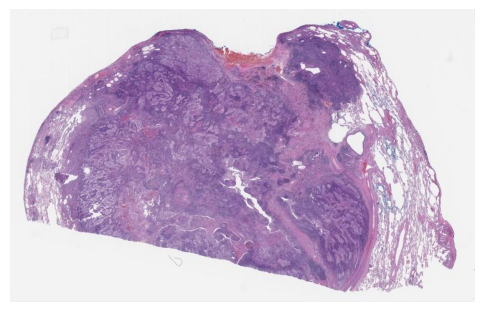

In [14]:
import matplotlib.pyplot as plt

# Step 1: 从 downsample level 读取整图（thumbnail）
thumb_level = 6  # 你刚刚看到一共有 9 层，6~7 是合适的

thumb = wsi.read_region(
    location=(0, 0),
    level=thumb_level,
    size=wsi.level_dimensions[thumb_level]
)

plt.figure(figsize=(6, 6))
plt.imshow(thumb)
plt.axis("off")


(np.float64(-0.5), np.float64(746.5), np.float64(469.5), np.float64(-0.5))

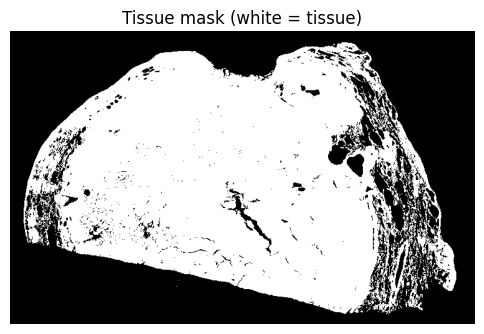

In [15]:
import numpy as np
import cv2

# 把 thumbnail 转成 numpy
thumb_np = np.array(thumb)

# 转灰度
gray = cv2.cvtColor(thumb_np, cv2.COLOR_RGB2GRAY)

# OTSU 自动阈值
_, tissue_mask = cv2.threshold(
    gray,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# 看 mask
plt.figure(figsize=(6, 6))
plt.imshow(tissue_mask, cmap="gray")
plt.title("Tissue mask (white = tissue)")
plt.axis("off")


Number of tissue pixels: 183447
Thumbnail tissue point: 313 239


(np.float64(-0.5), np.float64(746.5), np.float64(469.5), np.float64(-0.5))

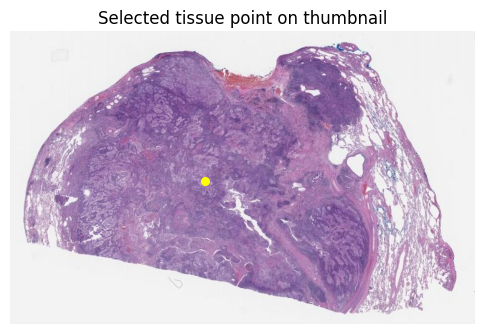

In [16]:
# Step 3: 从 tissue mask 中选一个组织点

ys, xs = np.where(tissue_mask > 0)

print("Number of tissue pixels:", len(xs))

# 取中间一个，避免边缘
idx = len(xs) // 2
tx, ty = xs[idx], ys[idx]

print("Thumbnail tissue point:", tx, ty)

# 在 thumbnail 上可视化这个点
plt.figure(figsize=(6, 6))
plt.imshow(thumb)
plt.scatter(tx, ty, c="yellow", s=30)
plt.title("Selected tissue point on thumbnail")
plt.axis("off")


In [17]:
# Step 4: thumbnail 坐标 → level-0 坐标

scale_x = wsi.level_dimensions[0][0] / wsi.level_dimensions[thumb_level][0]
scale_y = wsi.level_dimensions[0][1] / wsi.level_dimensions[thumb_level][1]

x0 = int(tx * scale_x)
y0 = int(ty * scale_y)

print("Mapped to level-0 coords:", x0, y0)


Mapped to level-0 coords: 20032 15319


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

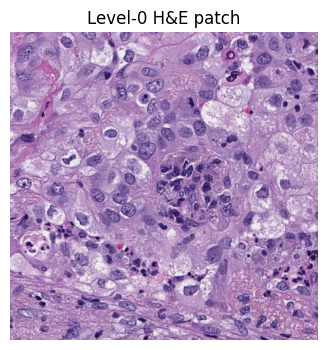

In [18]:
# Step 5: 在 level-0 取真实 H&E patch

patch = wsi.read_region(
    location=(x0, y0),
    level=0,
    size=(512, 512)
)

plt.figure(figsize=(4, 4))
plt.imshow(patch)
plt.title("Level-0 H&E patch")
plt.axis("off")


In [19]:
# === Step A1: thumbnail 坐标 → level-0 坐标 ===

scale = wsi.level_downsamples[thumb_level]

ys, xs = np.where(tissue_mask > 0)

# 随机选 100 个 tissue 点（你可以改）
num_patches = 100
idxs = np.random.choice(len(xs), size=num_patches, replace=False)

coords_level0 = []
for i in idxs:
    x_thumb, y_thumb = xs[i], ys[i]
    x0 = int(x_thumb * scale)
    y0 = int(y_thumb * scale)
    coords_level0.append((x0, y0))

len(coords_level0)


100

In [20]:
thumb = wsi.read_region(
    location=(0, 0),
    level=thumb_level,
    size=wsi.level_dimensions[thumb_level]
)
thumb_np = np.array(thumb)[:, :, :3]  # RGBA → RGB


In [21]:
def fast_patch_coords_from_thumbnail(
    tissue_mask,
    wsi,
    thumb_level,
    num_patches=100,
):
    """
    从 thumbnail-level tissue mask
    快速生成 level-0 patch 起点坐标

    返回：
        List[(x0, y0)]
    """
    # thumbnail → level-0 的缩放比例
    scale = wsi.level_downsamples[thumb_level]

    # 所有 tissue 像素坐标（thumbnail 空间）
    ys, xs = np.where(tissue_mask > 0)

    # 随机选一些点
    idxs = np.random.choice(len(xs), size=num_patches, replace=False)

    coords_level0 = []
    for i in idxs:
        x_thumb, y_thumb = xs[i], ys[i]
        x0 = int(x_thumb * scale)
        y0 = int(y_thumb * scale)
        coords_level0.append((x0, y0))

    return coords_level0


In [22]:
coords_level0 = fast_patch_coords_from_thumbnail(
    tissue_mask=tissue_mask,
    wsi=wsi,
    thumb_level=thumb_level,
    num_patches=100,
)

len(coords_level0)


100

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

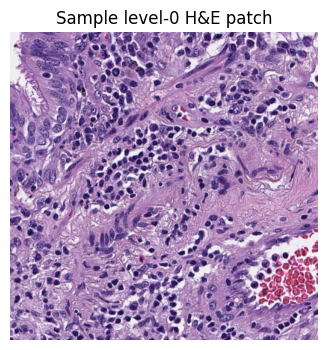

In [23]:
# 取第一个坐标试试
x0, y0 = coords_level0[0]

patch = wsi.read_region(
    location=(x0, y0),
    level=0,
    size=(512, 512)
)

patch = np.array(patch)[:, :, :3]  # RGBA → RGB

plt.figure(figsize=(4,4))
plt.imshow(patch)
plt.title("Sample level-0 H&E patch")
plt.axis("off")


In [24]:
def fast_get_patch_coords(
    wsi,
    tissue_mask,
    thumb_level,
    patch_size=1024,
    num_patches=500,
):
    """
    Fast patch coordinate generation using thumbnail-level tissue mask.

    Returns:
        Set[(x, y)]  # level-0 patch start coordinates
    """
    scale = wsi.level_downsamples[thumb_level]

    ys, xs = np.where(tissue_mask > 0)

    if len(xs) < num_patches:
        num_patches = len(xs)

    idxs = np.random.choice(len(xs), size=num_patches, replace=False)

    patch_coords = set()
    for i in idxs:
        x_thumb, y_thumb = xs[i], ys[i]
        x0 = int(x_thumb * scale)
        y0 = int(y_thumb * scale)

        patch_coords.add((x0, y0))

    return patch_coords


In [25]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


In [26]:
def get_tissue_mask_otsu(thumbnail_rgb: np.ndarray) -> np.ndarray:
    """
    Input:
        thumbnail_rgb: (H, W, 3) RGB numpy array
    Output:
        tissue_mask: (H, W) binary mask, 1 = tissue
    """
    gray = cv2.cvtColor(thumbnail_rgb, cv2.COLOR_RGB2GRAY)
    _, tissue_mask = cv2.threshold(
        gray,
        0,
        255,
        cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )
    return (tissue_mask > 0).astype(np.uint8)


In [27]:
def sample_coords_from_mask(
    tissue_mask: np.ndarray,
    level_downsample: float,
    num_patches: int = 100,
) -> list[tuple[int, int]]:
    """
    Randomly sample level-0 coordinates from tissue mask
    """
    ys, xs = np.where(tissue_mask > 0)

    if len(xs) == 0:
        return []

    idxs = np.random.choice(
        len(xs),
        size=min(num_patches, len(xs)),
        replace=False
    )

    coords_level0 = []
    for i in idxs:
        x0 = int(xs[i] * level_downsample)
        y0 = int(ys[i] * level_downsample)
        coords_level0.append((x0, y0))

    return coords_level0


In [28]:
def extract_patches_from_coords(
    wsi,
    coords_level0: list[tuple[int, int]],
    patch_size: int = 512,
):
    patches = []
    for (x0, y0) in coords_level0:
        patch = wsi.read_region(
            location=(x0, y0),
            level=0,
            size=(patch_size, patch_size)
        )
        patch = np.array(patch)[:, :, :3]  # RGBA → RGB
        patches.append(patch)
    return patches


(np.float64(-0.5), np.float64(746.5), np.float64(469.5), np.float64(-0.5))

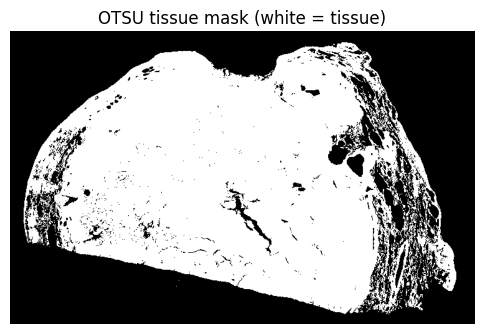

In [29]:
thumb_rgb = thumb_np  # 你已经有这个

tissue_mask = get_tissue_mask_otsu(thumb_rgb)

plt.figure(figsize=(6, 5))
plt.imshow(tissue_mask, cmap="gray")
plt.title("OTSU tissue mask (white = tissue)")
plt.axis("off")


In [30]:
coords = sample_coords_from_mask(
    tissue_mask=tissue_mask,
    level_downsample=wsi.level_downsamples[thumb_level],
    num_patches=50
)

len(coords)


50

(np.float64(-0.5), np.float64(746.5), np.float64(469.5), np.float64(-0.5))

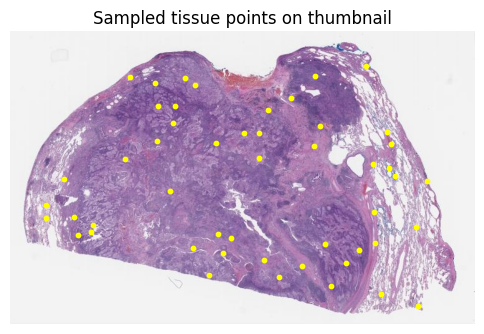

In [31]:
# 在 thumbnail 上画点
ys, xs = zip(*[(y//int(wsi.level_downsamples[thumb_level]),
                x//int(wsi.level_downsamples[thumb_level]))
               for (x, y) in coords])

plt.figure(figsize=(6, 5))
plt.imshow(thumb_rgb)
plt.scatter(xs, ys, c="yellow", s=10)
plt.title("Sampled tissue points on thumbnail")
plt.axis("off")


In [32]:
coords_debug = coords[:3]
coords_debug


[(15104, 11264), (38144, 27008), (31360, 4544)]

In [33]:
patches_debug = []

for i, (x0, y0) in enumerate(coords_debug):
    print(f"[{i}] Reading patch at:", x0, y0)

    patch = wsi.read_region(
        location=(x0, y0),
        level=0,
        size=(512, 512)
    )

    patch = np.array(patch)[:, :, :3]
    patches_debug.append(patch)


[0] Reading patch at: 15104 11264
[1] Reading patch at: 38144 27008
[2] Reading patch at: 31360 4544


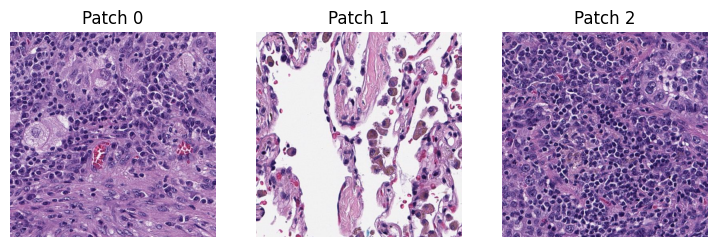

In [34]:
plt.figure(figsize=(9,3))
for i, patch in enumerate(patches_debug):
    plt.subplot(1, len(patches_debug), i+1)
    plt.imshow(patch)
    plt.title(f"Patch {i}")
    plt.axis("off")
plt.show()


In [35]:
def extract_patches_from_coords(
    wsi,
    coords,
    patch_size=512,
    level=0
):
    patches = []
    for (x0, y0) in coords:
        patch = wsi.read_region(
            location=(x0, y0),
            level=level,
            size=(patch_size, patch_size)
        )
        patch = np.array(patch)[:, :, :3]
        patches.append(patch)
    return patches


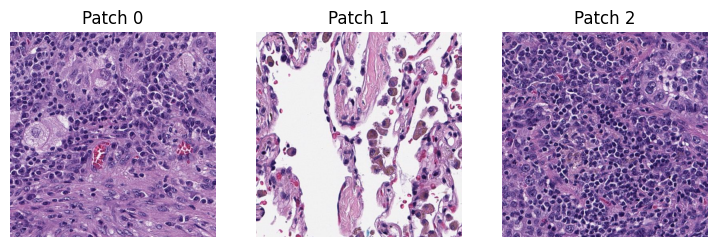

In [36]:
patches_test = extract_patches_from_coords(
    wsi=wsi,
    coords=coords[:3],
    patch_size=512
)

plt.figure(figsize=(9,3))
for i, p in enumerate(patches_test):
    plt.subplot(1, 3, i+1)
    plt.imshow(p)
    plt.title(f"Patch {i}")
    plt.axis("off")
plt.show()


In [37]:
# CellSAM + 依赖
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install git+https://github.com/vanvalenlab/CellSAM.git


Looking in indexes: https://download.pytorch.org/whl/cu118
  Cloning https://github.com/vanvalenlab/CellSAM.git to /tmp/pip-req-build-77u4ie__
  Running command git clone --filter=blob:none --quiet https://github.com/vanvalenlab/CellSAM.git /tmp/pip-req-build-77u4ie__
  Resolved https://github.com/vanvalenlab/CellSAM.git to commit 35bc6e0da6616cf7530e52d0282ee17bb1a57429
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-install-izkbv2cl/segment-anything_ca30184ee7d3473fa615d8ce1b3d12b1
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-install-izkbv2cl/segment-anything_ca30184ee7d3473fa615d8ce1b3d12b1
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... do

In [1]:
import torch
from cellsam import CellSAM
import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

model = CellSAM(pretrained=True).to(device)
model.eval()


ModuleNotFoundError: No module named 'cellsam'

In [2]:
!pip install -U torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118


Looking in indexes: https://download.pytorch.org/whl/cu118


In [3]:
import torch
print(torch.__version__)
print("CUDA available:", torch.cuda.is_available())


2.9.0+cu126
CUDA available: True


In [4]:
import torch
print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


Torch version: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA L4


In [5]:
# 假设 patches_test 是你刚才那 3 个 patch
patch = patches_test[0]

import torch
from cellsam import CellSAM

device = "cuda"
model = CellSAM(pretrained=True).to(device)
model.eval()


NameError: name 'patches_test' is not defined

In [6]:
import torch

print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


Torch: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA L4


In [7]:
!pip install git+https://github.com/vanvalenlab/CellSAM.git


  Cloning https://github.com/vanvalenlab/CellSAM.git to /tmp/pip-req-build-g27o9331
  Running command git clone --filter=blob:none --quiet https://github.com/vanvalenlab/CellSAM.git /tmp/pip-req-build-g27o9331
  Resolved https://github.com/vanvalenlab/CellSAM.git to commit 35bc6e0da6616cf7530e52d0282ee17bb1a57429
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-install-ln83xran/segment-anything_f4a9bc34bdaf477da3a246886073cc38
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-install-ln83xran/segment-anything_f4a9bc34bdaf477da3a246886073cc38
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [7]:
patch = wsi.read_region(
    location=(x0, y0),
    level=0,
    size=(512, 512)
)
patch = np.array(patch)[:, :, :3]  # RGB


In [8]:
from openslide import OpenSlide

wsi_path = "/content/DHMC_0039.tif"  # 确认文件名在 /content 里
wsi = OpenSlide(wsi_path)

print("WSI loaded")
print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])


WSI loaded
Level count: 9
Level 0 size: (47808, 30127)


In [3]:
# 随便选一个安全坐标（避免边缘）
x0, y0 = 10000, 10000


In [5]:
import numpy as np

patch = wsi.read_region(
    location=(x0, y0),
    level=0,
    size=(512, 512)
)

patch = np.array(patch)[:, :, :3]  # RGBA -> RGB


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

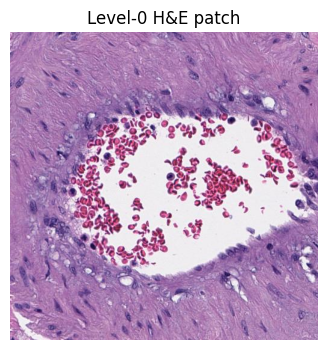

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(4,4))
plt.imshow(patch)
plt.title("Level-0 H&E patch")
plt.axis("off")


In [9]:
# 安装 CellSAM（官方实现）
!pip install git+https://github.com/MouseLand/cellSAM.git


  Cloning https://github.com/MouseLand/cellSAM.git to /tmp/pip-req-build-blnb4ttj
  Running command git clone --filter=blob:none --quiet https://github.com/MouseLand/cellSAM.git /tmp/pip-req-build-blnb4ttj
  fatal: could not read Username for 'https://github.com': No such device or address
  error: subprocess-exited-with-error
  
  × git clone --filter=blob:none --quiet https://github.com/MouseLand/cellSAM.git /tmp/pip-req-build-blnb4ttj did not run successfully.
  │ exit code: 128
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git clone --filter=blob:none --quiet https://github.com/MouseLand/cellSAM.git /tmp/pip-req-build-blnb4ttj did not run successfully.
│ exit code: 128
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [10]:
!pip install cellsam


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-install-y7wzukdc/segment-anything_a46a7f58a7074cb3b2d25a51913eddd0
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-install-y7wzukdc/segment-anything_a46a7f58a7074cb3b2d25a51913eddd0
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [11]:
!wget https://github.com/MouseLand/CellSAM/archive/refs/heads/main.zip
!unzip main.zip


--2025-12-18 21:47:16--  https://github.com/MouseLand/CellSAM/archive/refs/heads/main.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-12-18 21:47:16 ERROR 404: Not Found.

unzip:  cannot find or open main.zip, main.zip.zip or main.zip.ZIP.


In [12]:
import sys
sys.path.append("/content/CellSAM-main")


In [13]:
from cellSAM import CellSAM
print("MouseLand CellSAM import OK")


MouseLand CellSAM import OK


In [14]:
import cellSAM
print(cellSAM.__file__)


/usr/local/lib/python3.12/dist-packages/cellSAM/__init__.py


array([[[201, 155, 201],
        [193, 150, 193],
        [162, 119, 162],
        ...,
        [194, 149, 190],
        [200, 155, 196],
        [207, 162, 203]],

       [[229, 182, 226],
        [240, 193, 237],
        [212, 167, 210],
        ...,
        [194, 153, 193],
        [199, 157, 197],
        [212, 170, 210]],

       [[222, 175, 221],
        [252, 205, 251],
        [240, 194, 240],
        ...,
        [202, 160, 200],
        [197, 152, 195],
        [207, 162, 205]],

       ...,

       [[171, 130, 188],
        [176, 137, 200],
        [160, 128, 191],
        ...,
        [158, 122, 170],
        [159, 123, 171],
        [177, 141, 189]],

       [[172, 134, 193],
        [153, 118, 182],
        [131, 102, 166],
        ...,
        [140, 104, 152],
        [142, 106, 154],
        [163, 127, 175]],

       [[159, 121, 180],
        [123,  88, 152],
        [105,  75, 139],
        ...,
        [159, 121, 168],
        [175, 137, 184],
        [189, 151, 198]]], dtype=uint8)
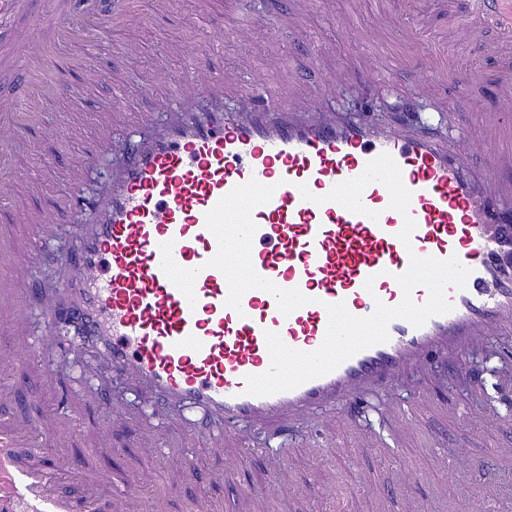

In [15]:
patch  # shape: (512, 512, 3), uint8


In [16]:
wsi


OpenSlide('/content/DHMC_0039.tif')

In [17]:
from tiffslide import TiffSlide

wsi_path = "/content/DHMC_0039.tif"
wsi = TiffSlide(wsi_path)

print("WSI loaded")
print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)


ModuleNotFoundError: No module named 'tiffslide'

In [20]:
!pip install tiffslide


  Using cached tiffslide-2.5.1-py3-none-any.whl.metadata (11 kB)
  Using cached tifffile-2025.5.10-py3-none-any.whl.metadata (31 kB)
  Using cached zarr-2.18.7-py3-none-any.whl.metadata (5.8 kB)
  Using cached asciitree-0.3.3.tar.gz (4.0 kB)
  Preparing metadata (setup.py) ... done
  Using cached fasteners-0.20-py3-none-any.whl.metadata (4.8 kB)
  Using cached numcodecs-0.15.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.9 kB)
  Using cached deprecated-1.3.1-py2.py3-none-any.whl.metadata (5.9 kB)
Using cached tiffslide-2.5.1-py3-none-any.whl (32 kB)
Using cached tifffile-2025.5.10-py3-none-any.whl (226 kB)
Using cached zarr-2.18.7-py3-none-any.whl (211 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 156.2 MB/s eta 0:00:00
Using cached fasteners-0.20-py3-none-any.whl (18 kB)
Using cached deprecated-1.3.1-py2.py3-none-any.whl (11 kB)
  Created wheel for asciitree: filename=asciitree-0.3.3-py3-none-any.whl size=5031 sha256=327eb99cc69a33d789ba408fd958d

In [21]:
from tiffslide import TiffSlide
print("tiffslide import OK")


tiffslide import OK


In [22]:
from tiffslide import TiffSlide

wsi_path = "/content/DHMC_0039.tif"
wsi = TiffSlide(wsi_path)

print("WSI loaded")
print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)


WSI loaded
Level count: 9
Level 0 size: (47808, 30127)
Downsamples: (1.0, 2.000033193918874, 4.000199176736157, 8.000929614873838, 16.003985122210416, 32.00797024442083, 64.05, 128.18579088471847, 257.26399228012133)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

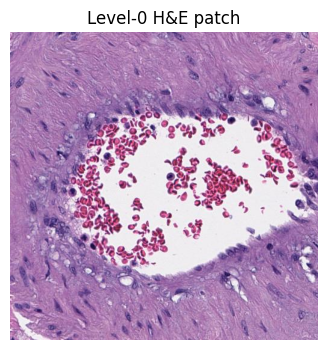

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# 选一个安全坐标（左上角）
x0, y0 = 10000, 10000

patch = wsi.read_region(
    location=(x0, y0),
    level=0,
    size=(512, 512)
)

patch = np.array(patch)[:, :, :3]  # RGBA → RGB

plt.figure(figsize=(4,4))
plt.imshow(patch)
plt.title("Level-0 H&E patch")
plt.axis("off")


In [24]:
import torch

# numpy (H, W, C) → torch (1, C, H, W)
img_tensor = torch.from_numpy(patch).permute(2, 0, 1).float() / 255.0
img_tensor = img_tensor.unsqueeze(0).cuda()

print("Input tensor shape:", img_tensor.shape)


Input tensor shape: torch.Size([1, 3, 512, 512])


In [27]:
from cellSAM import CellSAM

model = CellSAM(pretrained=True).cuda()
model.eval()

with torch.no_grad():
    outputs = model(img_tensor)


TypeError: CellSAM.__init__() got an unexpected keyword argument 'pretrained'

In [26]:
from cellSAM import CellSAM
import torch

model = CellSAM().cuda()
model.eval()


TypeError: CellSAM.__init__() missing 1 required positional argument: 'config'

In [28]:
from cellSAM import CellSAM
import inspect

print(inspect.signature(CellSAM))


(config)


In [29]:
from cellSAM.config import get_default_config

cfg = get_default_config()
cfg


ModuleNotFoundError: No module named 'cellSAM.config'

In [30]:
from cellSAM import CellSAM
import inspect

print(inspect.getsource(CellSAM.__init__))


    def __init__(self, config):
        super().__init__()

        self.model = sam_model_registry["vit_b"]()
        self.mask_threshold = 0.4
        self.iou_threshold = 0.5
        self.bbox_threshold = 0.4
        self.sam_transform = ResizeLongestSide(1024)

        config = Namespace(**config)
        self.cellfinder = CellfinderAnchorDetr(config)

        self.adv_mode = True
        self.model_cp = copy.deepcopy(self.model)

        # Transforms
        self.normalize = T.Compose([
            T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])



In [31]:
import cellSAM
print(cellSAM.__file__)


/usr/local/lib/python3.12/dist-packages/cellSAM/__init__.py


In [32]:
import os, cellSAM
base = os.path.dirname(cellSAM.__file__)
os.listdir(base)


['AnchorDETR',
 'model.py',
 'sam_inference.py',
 '__init__.py',
 '_auth.py',
 'cellsam_pipeline.py',
 'modelconfig.yaml',
 'napari_plugin',
 '__pycache__',
 'wsi.py',
 'utils.py',
 'cli.py']

In [33]:
import yaml
import cellSAM
import os

base = os.path.dirname(cellSAM.__file__)
cfg_path = os.path.join(base, "modelconfig.yaml")

with open(cfg_path, "r") as f:
    cfg = yaml.safe_load(f)

cfg


{'enc_layers': 6,
 'dec_layers': 6,
 'dim_feedforward': 1024,
 'hidden_dim': 256,
 'dropout': 0.0,
 'nheads': 8,
 'num_query_position': 3500,
 'num_query_pattern': 1,
 'spatial_prior': 'learned',
 'attention_type': 'RCDA',
 'num_feature_levels': 1,
 'device': 'cuda',
 'seed': 42,
 'num_classes': 2}

In [34]:
import torch
from cellSAM import CellSAM

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

model = CellSAM(cfg).to(device)
model.eval()

print("✅ CellSAM model initialized")


Using device: cuda
✅ CellSAM model initialized


In [35]:
patch.shape
# (512, 512, 3)
# dtype: uint8


(512, 512, 3)

In [37]:
with torch.no_grad():
    outputs = model(patch)

type(outputs)


AttributeError: 'numpy.ndarray' object has no attribute 'to'

In [38]:
patch.shape
# (512, 512, 3), dtype uint8


(512, 512, 3)

In [39]:
import torch

# numpy → torch
img = torch.from_numpy(patch)          # (H, W, 3), uint8
img = img.permute(2, 0, 1)              # (3, H, W)
img = img.float() / 255.0               # float32, [0,1]
img = img.unsqueeze(0).cuda()           # (1, 3, H, W)


In [40]:
img.shape, img.device, img.dtype
# (1, 3, 512, 512), cuda, float32


(torch.Size([1, 3, 512, 512]), device(type='cuda', index=0), torch.float32)

In [41]:
with torch.no_grad():
    outputs = model(img)

type(outputs)


torch.Tensor

In [42]:
import cellSAM.sam_inference as si
import inspect

print(inspect.getsource(si))


from typing import Tuple
import copy

import numpy as np
import warnings
import torchvision
import torch
from torch import nn
import torch.nn.functional as F
from torchvision.transforms.functional import resize, to_pil_image
from torchvision import tv_tensors
from sklearn.cluster import KMeans

import torchvision.transforms.v2 as T
from .AnchorDETR.models import build_inference_model
from .AnchorDETR import transforms as anchorT
from segment_anything import (
    sam_model_registry,
)
from scipy import ndimage


def keep_largest_object(img: np.ndarray) -> np.ndarray:
    """
    Keep only the largest object in the binary image (np.array).
    """
    img_array = img
    label_image, _ = ndimage.label(img_array)
    label_histogram = np.bincount(label_image.ravel())
    label_histogram[0] = 0  # Clear the background label
    largest_object_label = label_histogram.argmax()
    cleaned_array = np.where(label_image == largest_object_label, img_array.max(), 0)

    return cleaned_array


#

In [43]:
# patch: numpy array, shape (512, 512, 3), uint8
patch.shape


(512, 512, 3)

In [44]:
import torch

img = torch.from_numpy(patch).permute(2, 0, 1)   # (3, H, W)
img = img.float()                                # 不要 /255（内部会处理）
imgs = [img]                                    # 必须是 list


In [45]:
with torch.no_grad():
    inst_mask, masks, embeddings, boxes = model.predict(imgs)


In [46]:
inst_mask.shape
# (H, W)
np.unique(inst_mask)[:10]
# [0, 1, 2, 3, ...]  ← 每个数字 = 一个细胞


AttributeError: 'NoneType' object has no attribute 'shape'

In [47]:
inst_mask, masks, embeddings, boxes = model.predict(imgs)

print(inst_mask, masks, boxes)


None None None


In [48]:
model.iou_threshold = 0.1
model.mask_threshold = 0.2
model.bbox_threshold = 0.2


In [49]:
inst_mask, masks, embeddings, boxes = model.predict(imgs)


In [50]:
# imgs 是 [C,H,W] 的 torch.Tensor list（你现在就是）
boxes = model.generate_bounding_boxes(imgs)

print(boxes)
print("Num boxes:", [len(b) for b in boxes])


[tensor([], device='cuda:0', size=(0, 4))]
Num boxes: [0]


In [51]:
import numpy as np
import cv2

# thumb_rgb: thumbnail 的 RGB numpy array (H, W, 3)
thumb = thumb_rgb.copy()

# 转 HSV，取 saturation + value 作为 proxy
hsv = cv2.cvtColor(thumb, cv2.COLOR_RGB2HSV)
sat = hsv[:, :, 1]
val = hsv[:, :, 2]

# 简单核密度 proxy（经验很好用）
nuclei_score = sat * (255 - val)


NameError: name 'thumb_rgb' is not defined

In [52]:
type(thumb)


NameError: name 'thumb' is not defined

In [53]:
from tifffile import TiffSlide

wsi_path = "/content/DHMC_0039.tif"
wsi = TiffSlide(wsi_path)

print("WSI loaded")
print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])
print("Downsamples:", wsi.level_downsamples)


ImportError: cannot import name 'TiffSlide' from 'tifffile' (/usr/local/lib/python3.12/dist-packages/tifffile/__init__.py)

In [54]:
# 读取 level 0 的一个 patch
patch = wsi.read_region(
    location=(0, 0),
    level=0,
    size=(512, 512)
)

print(type(patch), patch.size)


<class 'PIL.Image.Image'> (512, 512)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

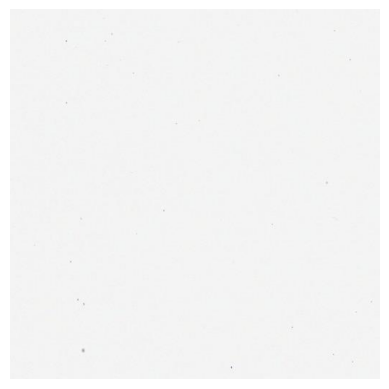

In [55]:
import matplotlib.pyplot as plt

plt.imshow(patch)
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

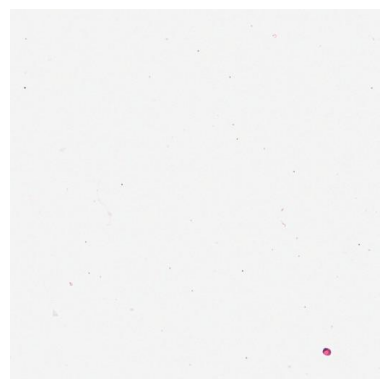

In [56]:
patch2 = wsi.read_region(
    location=(5000, 5000),  # 随便往里挪
    level=0,
    size=(512, 512)
).convert("RGB")

plt.imshow(patch2)
plt.axis("off")


(np.float64(-0.5), np.float64(2047.5), np.float64(1289.5), np.float64(-0.5))

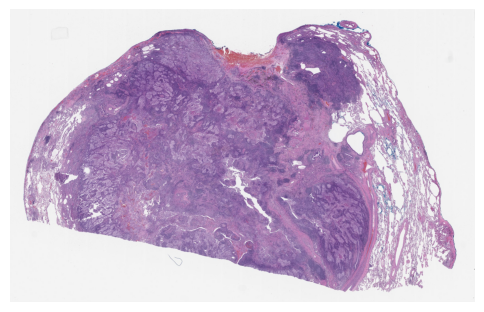

In [57]:
thumb = wsi.get_thumbnail((2048, 2048))
plt.figure(figsize=(6, 6))
plt.imshow(thumb)
plt.axis("off")


(np.float64(-0.5), np.float64(2047.5), np.float64(1289.5), np.float64(-0.5))

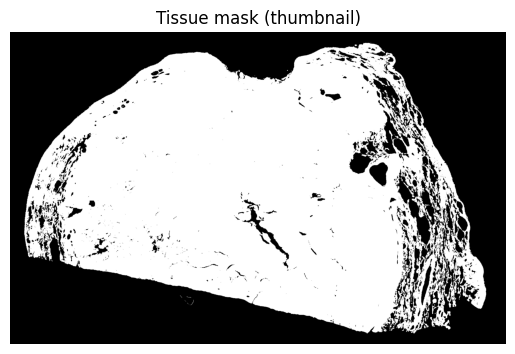

In [58]:
import numpy as np
import cv2

thumb_np = np.array(thumb)

# RGB -> HSV
hsv = cv2.cvtColor(thumb_np, cv2.COLOR_RGB2HSV)
s = hsv[:, :, 1]  # saturation 通道

# 经验阈值（非常稳）
tissue_mask = s > 20

plt.imshow(tissue_mask, cmap="gray")
plt.title("Tissue mask (thumbnail)")
plt.axis("off")


In [59]:
thumb_w, thumb_h = thumb.size
W, H = wsi.level_dimensions[0]

scale_x = W / thumb_w
scale_y = H / thumb_h


In [60]:
def iter_tissue_patches(
    wsi,
    tissue_mask_thumb,
    level=0,
    patch_size=512,
    stride=512,
    min_tissue_frac=0.2
):
    thumb_h, thumb_w = tissue_mask_thumb.shape
    W, H = wsi.level_dimensions[level]

    sx = W / thumb_w
    sy = H / thumb_h

    for ty in range(thumb_h):
        for tx in range(thumb_w):
            if not tissue_mask_thumb[ty, tx]:
                continue

            x = int(tx * sx)
            y = int(ty * sy)

            patch = wsi.read_region(
                location=(x, y),
                level=level,
                size=(patch_size, patch_size)
            ).convert("RGB")

            # 简单白背景过滤（保险）
            gray = np.array(patch.convert("L"))
            tissue_frac = np.mean(gray < 220)

            if tissue_frac < min_tissue_frac:
                continue

            yield (x, y), patch


(34758, 1074)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

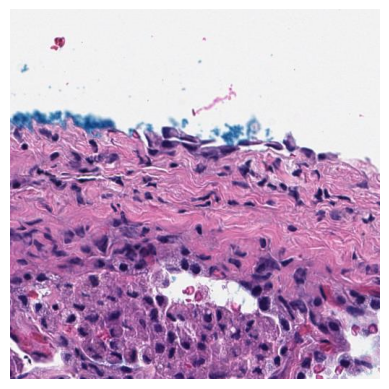

In [61]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print(coord)
plt.imshow(patch)
plt.axis("off")


In [ ]:
patch = patch.convert("RGB")


In [62]:
!pip install torch torchvision
!pip install opencv-python
!pip install git+https://github.com/facebookresearch/segment-anything.git


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-56zkoqay
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-56zkoqay
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [63]:
import torch
import cv2
from segment_anything import sam_model_registry, SamPredictor

print(torch.__version__)
print("SAM import OK")


2.9.0+cu126
SAM import OK


In [64]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
patch = patch.convert("RGB")


In [ ]:
import numpy as np

def iter_tissue_patches(
    wsi,
    tissue_mask_thumb,
    level=0,
    patch_size=512,
    stride=512,
    min_tissue_frac=0.2
):
    thumb_h, thumb_w = tissue_mask_thumb.shape
    W, H = wsi.level_dimensions[level]

    sx = W / thumb_w
    sy = H / thumb_h

    for ty in range(thumb_h):
        for tx in range(thumb_w):
            if not tissue_mask_thumb[ty, tx]:
                continue

            x = int(tx * sx)
            y = int(ty * sy)

            patch = wsi.read_region(
                location=(x, y),
                level=level,
                size=(patch_size, patch_size)
            ).convert("RGB")

            gray = np.array(patch.convert("L"))
            tissue_frac = np.mean(gray < 220)

            if tissue_frac < min_tissue_frac:
                continue

            yield (x, y), patch


In [65]:
print(iter_tissue_patches)


<function iter_tissue_patches at 0x78730f23b6a0>


(34758, 1074)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

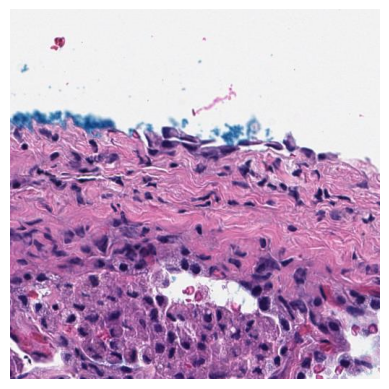

In [66]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print(coord)

import matplotlib.pyplot as plt
plt.imshow(patch)
plt.axis("off")


In [67]:
from tiffslide import TiffSlide

wsi_path = "/content/DHMC_0039.tif"
wsi = TiffSlide(wsi_path)

print("WSI reloaded")
print("Level count:", wsi.level_count)
print("Level 0 size:", wsi.level_dimensions[0])


WSI reloaded
Level count: 9
Level 0 size: (47808, 30127)


In [68]:
print(wsi)


TiffSlide('DHMC_0039.tif')


(34758, 1074)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

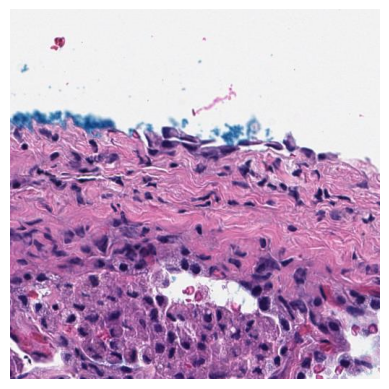

In [69]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print(coord)

import matplotlib.pyplot as plt
plt.imshow(patch)
plt.axis("off")


(np.float64(-0.5), np.float64(2047.5), np.float64(1289.5), np.float64(-0.5))

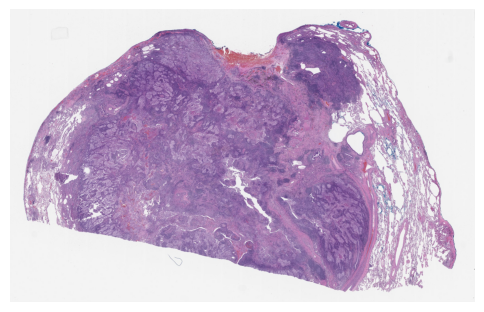

In [70]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 1. 重新拿 thumbnail
thumb = wsi.get_thumbnail((2048, 2048))

plt.figure(figsize=(6,6))
plt.imshow(thumb)
plt.axis("off")


(np.float64(-0.5), np.float64(2047.5), np.float64(1289.5), np.float64(-0.5))

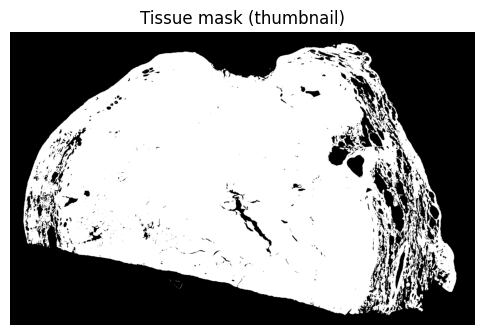

In [71]:
thumb_np = np.array(thumb)

# RGB -> HSV
hsv = cv2.cvtColor(thumb_np, cv2.COLOR_RGB2HSV)
s = hsv[:, :, 1]  # saturation 通道

# 经验阈值：区分白背景 vs H&E 组织
tissue_mask = s > 20

plt.figure(figsize=(6,6))
plt.imshow(tissue_mask, cmap="gray")
plt.title("Tissue mask (thumbnail)")
plt.axis("off")


In [72]:
print(type(tissue_mask), tissue_mask.shape)


<class 'numpy.ndarray'> (1290, 2048)


(34758, 1074)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

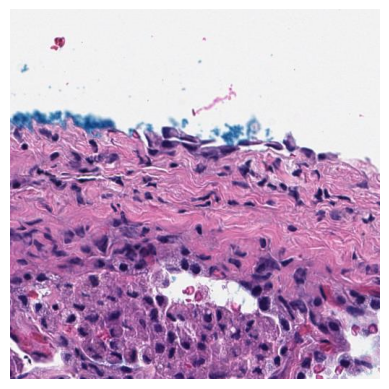

In [73]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print(coord)

plt.imshow(patch)
plt.axis("off")


In [74]:
import numpy as np

image = np.array(patch)
print(image.shape)   # 期望 (512, 512, 3)


(512, 512, 3)


In [75]:
import torch
from segment_anything import sam_model_registry, SamPredictor

device = "cuda" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry["vit_b"](
    checkpoint="sam_vit_b_01ec64.pth"
).to(device)

predictor = SamPredictor(sam)
print("SAM ready on", device)


FileNotFoundError: [Errno 2] No such file or directory: 'sam_vit_b_01ec64.pth'

In [76]:
import os
print(os.path.exists("sam_vit_b_01ec64.pth"))


False


In [77]:
import os
print(os.getcwd())


/content


In [78]:
!wget -O /content/sam_vit_b_01ec64.pth \
https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth


--2025-12-18 21:51:12--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.244.51.61, 18.244.51.110, 18.244.51.27, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.244.51.61|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘/content/sam_vit_b_01ec64.pth’

/content/sam_vit_b_ 100%[===================>] 357.67M   273MB/s    in 1.3s    

2025-12-18 21:51:14 (273 MB/s) - ‘/content/sam_vit_b_01ec64.pth’ saved [375042383/375042383]



In [79]:
import os
print(os.path.exists("/content/sam_vit_b_01ec64.pth"))


True


In [80]:
import torch
from segment_anything import sam_model_registry, SamPredictor

device = "cuda" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry["vit_b"](
    checkpoint="/content/sam_vit_b_01ec64.pth"
).to(device)

predictor = SamPredictor(sam)
print("SAM ready on", device)


SAM ready on cuda


In [81]:
predictor.set_image(image)
print("Image set for SAM:", image.shape)


Image set for SAM: (512, 512, 3)


In [82]:
import numpy as np

image = np.array(patch)
print("image shape:", image.shape)


image shape: (512, 512, 3)


coord: (34758, 1074)
image shape: (512, 512, 3)
Image set for SAM OK


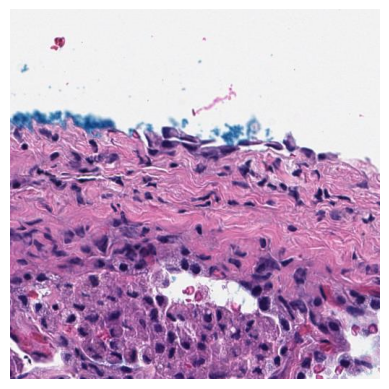

In [83]:
# ====== 1. 重新拿一个 patch（不依赖历史状态） ======
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print("coord:", coord)

import matplotlib.pyplot as plt
plt.imshow(patch)
plt.axis("off")

# ====== 2. patch → numpy image ======
import numpy as np
image = np.array(patch)
print("image shape:", image.shape)

# ====== 3. 设置给 SAM ======
predictor.set_image(image)
print("Image set for SAM OK")


WSI OK
tissue_mask OK
iter_tissue_patches OK
coord: (34758, 1074)
image shape: (512, 512, 3)
Image set for SAM OK


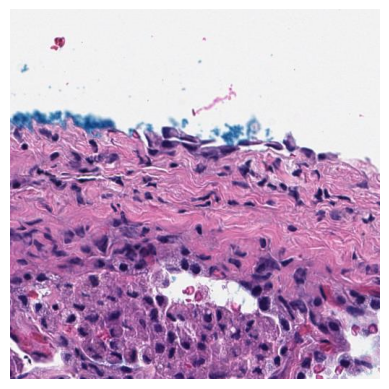

In [84]:
# =========================================================
# 0. imports
# =========================================================
import numpy as np
import cv2
import matplotlib.pyplot as plt

# =========================================================
# 1. 确保 WSI 存在
# =========================================================
from tiffslide import TiffSlide
wsi = TiffSlide("/content/DHMC_0039.tif")
print("WSI OK")

# =========================================================
# 2. thumbnail + tissue mask
# =========================================================
thumb = wsi.get_thumbnail((2048, 2048))
thumb_np = np.array(thumb)

hsv = cv2.cvtColor(thumb_np, cv2.COLOR_RGB2HSV)
tissue_mask = hsv[:, :, 1] > 20
print("tissue_mask OK")

# =========================================================
# 3. 定义 iter_tissue_patches（就在这个 cell）
# =========================================================
def iter_tissue_patches(
    wsi,
    tissue_mask_thumb,
    level=0,
    patch_size=512,
):
    th, tw = tissue_mask_thumb.shape
    W, H = wsi.level_dimensions[level]
    sx = W / tw
    sy = H / th

    for ty in range(th):
        for tx in range(tw):
            if not tissue_mask_thumb[ty, tx]:
                continue

            x = int(tx * sx)
            y = int(ty * sy)

            patch = wsi.read_region(
                location=(x, y),
                level=level,
                size=(patch_size, patch_size)
            ).convert("RGB")

            yield (x, y), patch

print("iter_tissue_patches OK")

# =========================================================
# 4. 拿一个 patch
# =========================================================
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
print("coord:", coord)

plt.imshow(patch)
plt.axis("off")

# =========================================================
# 5. patch → image
# =========================================================
image = np.array(patch)
print("image shape:", image.shape)

# =========================================================
# 6. 设置给 SAM
# =========================================================
predictor.set_image(image)
print("Image set for SAM OK")


In [85]:
H, W, _ = image.shape
box = np.array([[0, 0, W, H]])
print("box:", box)


box: [[  0   0 512 512]]


In [86]:
masks, scores, logits = predictor.predict(
    box=box,
    multimask_output=True
)

print("masks shape:", masks.shape)
print("scores:", scores)


masks shape: (3, 512, 512)
scores: [1.0030994  0.97261566 0.87221134]


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

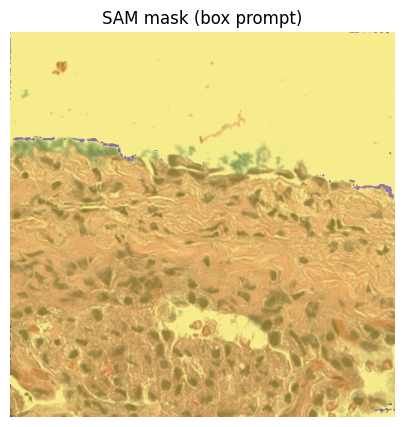

In [87]:
best_mask = masks[scores.argmax()]

plt.figure(figsize=(5,5))
plt.imshow(image)
plt.imshow(best_mask, alpha=0.5)
plt.title("SAM mask (box prompt)")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

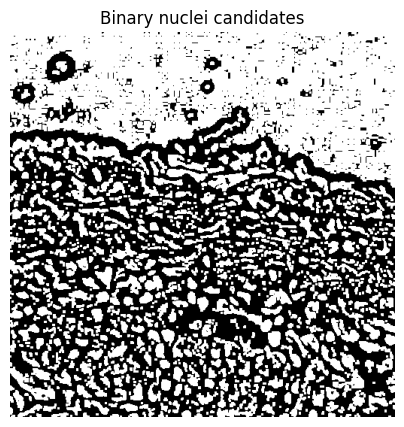

In [88]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. 灰度化
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# 2. 反相（核更亮）
gray_inv = 255 - gray

# 3. 自适应阈值（稳）
bw = cv2.adaptiveThreshold(
    gray_inv,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    31,
    2
)

# 4. 形态学去噪
kernel = np.ones((3,3), np.uint8)
bw = cv2.morphologyEx(bw, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(5,5))
plt.imshow(bw, cmap="gray")
plt.title("Binary nuclei candidates")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

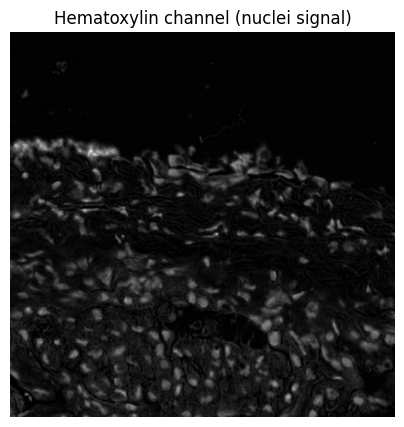

In [89]:
from skimage.color import rgb2hed
import numpy as np
import matplotlib.pyplot as plt

# HED 分解
hed = rgb2hed(image)

H = hed[:, :, 0]   # Hematoxylin channel
H_norm = (H - H.min()) / (H.max() - H.min())

plt.figure(figsize=(5,5))
plt.imshow(H_norm, cmap="gray")
plt.title("Hematoxylin channel (nuclei signal)")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

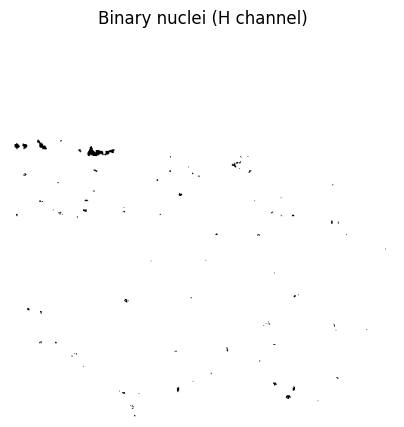

In [90]:
# 反相：让核更亮
H_inv = 1 - H_norm

# 稳定阈值（你这张图很适合）
bw = H_inv > 0.5   # 可微调 0.45–0.6

plt.figure(figsize=(5,5))
plt.imshow(bw, cmap="gray")
plt.title("Binary nuclei (H channel)")
plt.axis("off")


In [91]:
H = hed[:, :, 0]
H_norm = (H - H.min()) / (H.max() - H.min())
H_inv = 1 - H_norm
bw = H_inv > 0.5


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

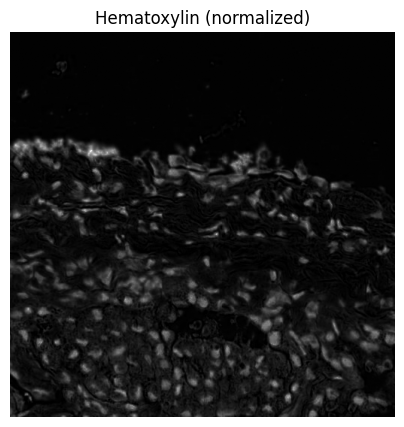

In [92]:
# H 通道：核是更“暗 / 负”的
H = hed[:, :, 0]

# 标准化（可选，但有助于直觉）
H_norm = (H - H.min()) / (H.max() - H.min())

plt.figure(figsize=(5,5))
plt.imshow(H_norm, cmap="gray")
plt.title("Hematoxylin (normalized)")
plt.axis("off")


In [93]:
from skimage.feature import peak_local_max
import numpy as np
import matplotlib.pyplot as plt

# 核在 H_norm 里是“亮点”
# 我们直接找局部极大值
centers = peak_local_max(
    H_norm,
    min_distance=8,      # 核之间最小距离（6–10 可调）
    threshold_abs=0.6,   # 只找足够“亮”的核
    exclude_border=False
)

print("Detected nuclei centers:", len(centers))


Detected nuclei centers: 23


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

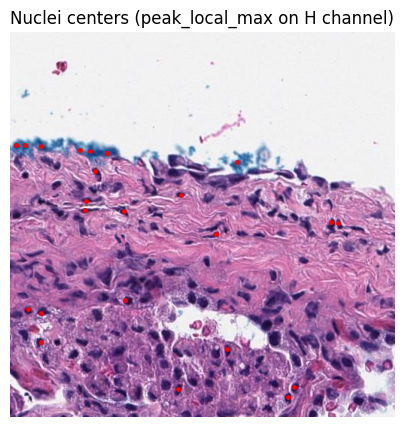

In [94]:
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.scatter(centers[:,1], centers[:,0], s=6, c="red")
plt.title("Nuclei centers (peak_local_max on H channel)")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

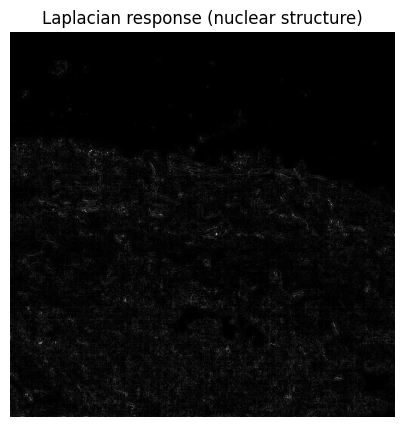

In [95]:
import cv2

# 用 Laplacian 强调核结构
lap = cv2.Laplacian(H_norm.astype(np.float32), cv2.CV_32F)
lap_abs = np.abs(lap)

plt.figure(figsize=(5,5))
plt.imshow(lap_abs, cmap="gray")
plt.title("Laplacian response (nuclear structure)")
plt.axis("off")


In [96]:
centers = peak_local_max(
    H_norm,
    min_distance=8,
    threshold_abs=0.6
)

# 只保留 Laplacian 响应足够强的点
filtered_centers = [
    (y, x) for (y, x) in centers
    if lap_abs[y, x] > np.percentile(lap_abs, 70)
]

filtered_centers = np.array(filtered_centers)
print("Filtered centers:", len(filtered_centers))


Filtered centers: 22


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

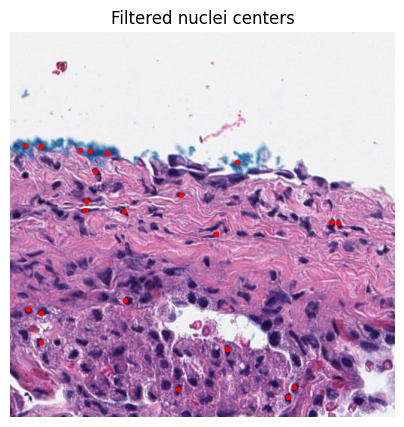

In [97]:
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.scatter(filtered_centers[:,1], filtered_centers[:,0], s=8, c="red")
plt.title("Filtered nuclei centers")
plt.axis("off")


In [98]:
centers1 = peak_local_max(H_norm, min_distance=10, threshold_abs=0.6)
centers2 = peak_local_max(H_norm, min_distance=6, threshold_abs=0.45)

centers = np.vstack([centers1, centers2])
print("Total centers (multi-scale):", len(centers))


Total centers (multi-scale): 135


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

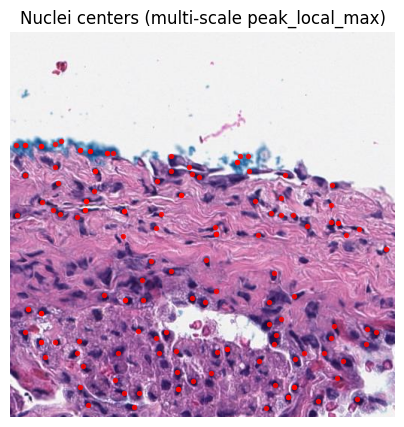

In [99]:
import matplotlib.pyplot as plt

plt.figure(figsize=(5,5))
plt.imshow(image)
plt.scatter(
    centers[:, 1],  # x = col
    centers[:, 0],  # y = row
    s=8,
    c="red",
    alpha=0.8
)
plt.title("Nuclei centers (multi-scale peak_local_max)")
plt.axis("off")


In [100]:
centers3 = peak_local_max(
    H_norm,
    min_distance=5,     # 更小距离
    threshold_abs=0.35  # 放宽亮度
)
print("centers3:", len(centers3))


centers3: 217


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

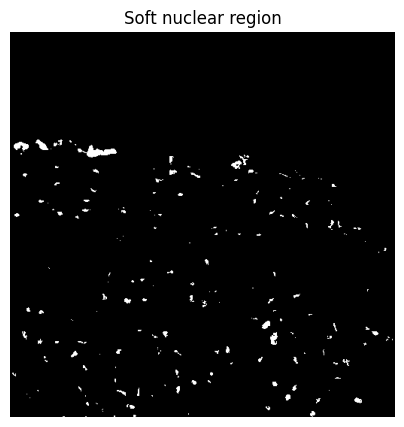

In [101]:
nuclear_mask = H_norm > 0.4  # 不要求精确，只是“可能是核的区域”

plt.figure(figsize=(5,5))
plt.imshow(nuclear_mask, cmap="gray")
plt.title("Soft nuclear region")
plt.axis("off")


In [102]:
centers4 = peak_local_max(
    H_norm,
    min_distance=4,
    threshold_abs=0.3,
    labels=nuclear_mask
)
print("centers4:", len(centers4))


centers4: 194


In [103]:
centers_all = np.vstack([
    centers,
    centers3,
    centers4
])

print("Total centers (merged):", len(centers_all))


Total centers (merged): 546


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

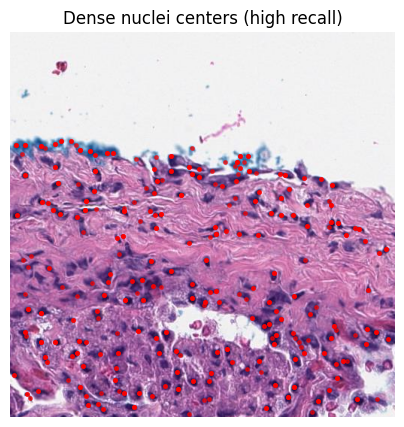

In [104]:
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.scatter(
    centers_all[:,1],
    centers_all[:,0],
    s=6,
    c="red",
    alpha=0.6
)
plt.title("Dense nuclei centers (high recall)")
plt.axis("off")


In [105]:
import numpy as np

H_img, W_img, _ = image.shape

box_size = 32   # 推荐 24–40，这里先用 32
cell_boxes = []

for (y, x) in centers_all:   # centers_all = 你刚才 merge 后的
    x1 = max(x - box_size//2, 0)
    y1 = max(y - box_size//2, 0)
    x2 = min(x + box_size//2, W_img)
    y2 = min(y + box_size//2, H_img)
    cell_boxes.append([x1, y1, x2, y2])

cell_boxes = np.array(cell_boxes)
print("Total cell boxes:", cell_boxes.shape)


Total cell boxes: (546, 4)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

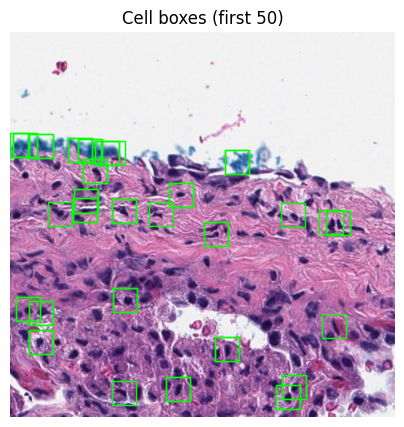

In [106]:
import matplotlib.pyplot as plt

plt.figure(figsize=(5,5))
plt.imshow(image)

for box in cell_boxes[:50]:
    x1, y1, x2, y2 = box
    plt.gca().add_patch(
        plt.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            fill=False,
            edgecolor="lime",
            linewidth=1
        )
    )

plt.title("Cell boxes (first 50)")
plt.axis("off")


In [107]:
box_size = 32
offsets = [(-6, 0), (6, 0), (0, -6), (0, 6), (0, 0)]  # 十字型 5 个 box

H_img, W_img, _ = image.shape
cell_boxes_dense = []

for (y, x) in centers_all:
    for dy, dx in offsets:
        cx = x + dx
        cy = y + dy

        x1 = max(cx - box_size//2, 0)
        y1 = max(cy - box_size//2, 0)
        x2 = min(cx + box_size//2, W_img)
        y2 = min(cy + box_size//2, H_img)

        cell_boxes_dense.append([x1, y1, x2, y2])

cell_boxes_dense = np.array(cell_boxes_dense)
print("Dense cell boxes:", cell_boxes_dense.shape)


Dense cell boxes: (2730, 4)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

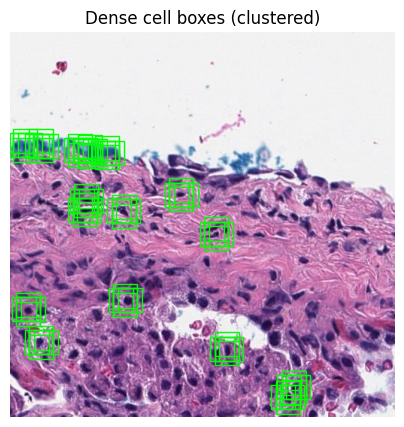

In [108]:
plt.figure(figsize=(5,5))
plt.imshow(image)

for box in cell_boxes_dense[:80]:  # 看 80 个就够
    x1, y1, x2, y2 = box
    plt.gca().add_patch(
        plt.Rectangle(
            (x1, y1),
            x2-x1,
            y2-y1,
            fill=False,
            edgecolor="lime",
            linewidth=1
        )
    )

plt.title("Dense cell boxes (clustered)")
plt.axis("off")


In [109]:
print("centers_all:", len(centers_all))
print("cell_boxes_dense:", len(cell_boxes_dense))


centers_all: 546
cell_boxes_dense: 2730


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

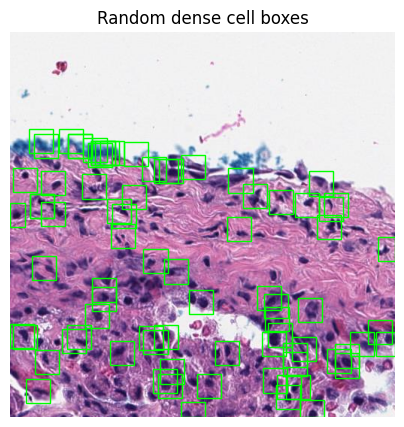

In [110]:
import random

plt.figure(figsize=(5,5))
plt.imshow(image)

for box in random.sample(list(cell_boxes_dense), 80):  # 随机 80 个
    x1, y1, x2, y2 = box
    plt.gca().add_patch(
        plt.Rectangle(
            (x1, y1),
            x2-x1,
            y2-y1,
            fill=False,
            edgecolor="lime",
            linewidth=1
        )
    )

plt.title("Random dense cell boxes")
plt.axis("off")


In [111]:
box_size = 48   # ⬅️ 关键：从 32 → 48
offsets = [
    (0, 0),
    (-12, 0), (12, 0), (0, -12), (0, 12),
    (-12, -12), (-12, 12), (12, -12), (12, 12)
]  # ⬅️ 九宫格 offsets

H_img, W_img, _ = image.shape
cell_boxes_dense = []

for (y, x) in centers_all:
    for dy, dx in offsets:
        cx = x + dx
        cy = y + dy

        x1 = max(cx - box_size//2, 0)
        y1 = max(cy - box_size//2, 0)
        x2 = min(cx + box_size//2, W_img)
        y2 = min(cy + box_size//2, H_img)

        cell_boxes_dense.append([x1, y1, x2, y2])

cell_boxes_dense = np.array(cell_boxes_dense)
print("Dense cell boxes:", len(cell_boxes_dense))


Dense cell boxes: 4914


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

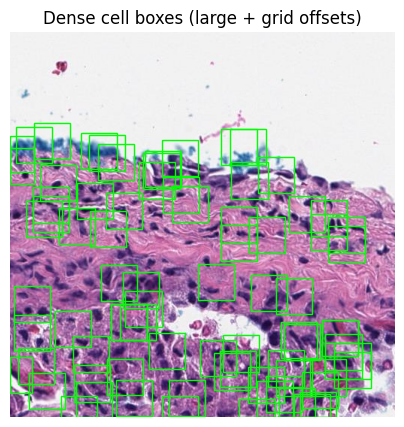

In [112]:
import random
plt.figure(figsize=(5,5))
plt.imshow(image)

for box in random.sample(list(cell_boxes_dense), 80):
    x1, y1, x2, y2 = box
    plt.gca().add_patch(
        plt.Rectangle(
            (x1, y1),
            x2-x1,
            y2-y1,
            fill=False,
            edgecolor="lime",
            linewidth=1
        )
    )

plt.title("Dense cell boxes (large + grid offsets)")
plt.axis("off")


In [113]:
predictor.set_image(image)

all_masks = []
all_scores = []

for box in cell_boxes_dense:
    masks, scores, logits = predictor.predict(
        box=np.array(box),
        multimask_output=False
    )
    all_masks.append(masks[0])
    all_scores.append(scores[0])

print("Raw SAM masks:", len(all_masks))


Raw SAM masks: 4914


In [114]:
def mask_iou(m1, m2):
    inter = np.logical_and(m1, m2).sum()
    union = np.logical_or(m1, m2).sum()
    return inter / (union + 1e-6)


In [115]:
keep_masks = []
keep_scores = []

order = np.argsort(all_scores)[::-1]  # score 高的优先

for idx in order:
    m = all_masks[idx]
    s = all_scores[idx]

    keep = True
    for km in keep_masks:
        if mask_iou(m, km) > 0.5:   # IoU 阈值可调 0.4–0.6
            keep = False
            break

    if keep:
        keep_masks.append(m)
        keep_scores.append(s)

print("Final cell masks after NMS:", len(keep_masks))


Final cell masks after NMS: 494


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

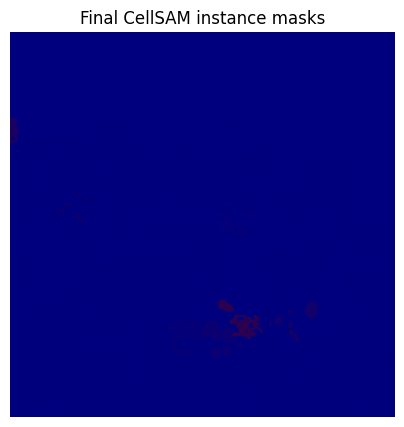

In [116]:
plt.figure(figsize=(5,5))
plt.imshow(image)

for m in keep_masks:
    plt.imshow(m, alpha=0.35, cmap="jet")

plt.title("Final CellSAM instance masks")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

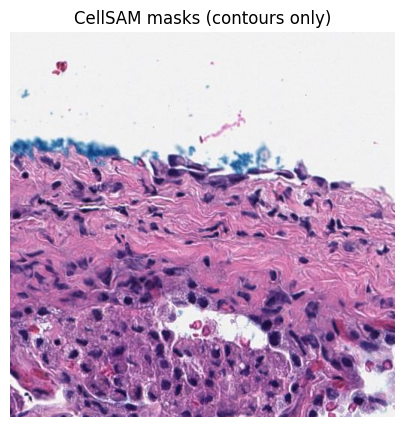

In [117]:
import cv2

plt.figure(figsize=(5,5))
plt.imshow(image)

for m in keep_masks:
    cnts, _ = cv2.findContours(
        m.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    cv2.drawContours(image, cnts, -1, (0,255,0), 1)

plt.title("CellSAM masks (contours only)")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

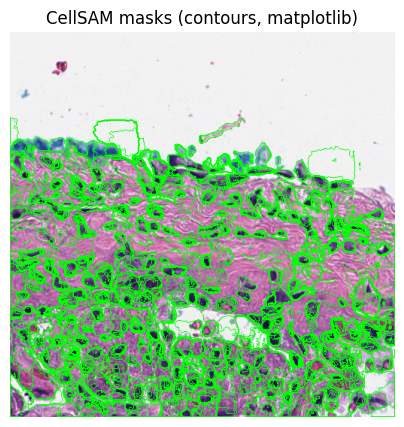

In [118]:
import matplotlib.pyplot as plt
import random

plt.figure(figsize=(5,5))
plt.imshow(image)

for m in random.sample(keep_masks, 40):  # 先只看 40 个
    plt.contour(
        m,
        levels=[0.5],
        colors="lime",
        linewidths=1
    )

plt.title("CellSAM masks (contours, matplotlib)")
plt.axis("off")


In [119]:
import numpy as np
import cv2

def mask_stats(m):
    area = m.sum()
    cnts, _ = cv2.findContours(m.astype(np.uint8),
                               cv2.RETR_EXTERNAL,
                               cv2.CHAIN_APPROX_SIMPLE)
    if len(cnts) == 0:
        return None
    cnt = max(cnts, key=cv2.contourArea)
    perimeter = cv2.arcLength(cnt, True)
    circularity = 4 * np.pi * area / (perimeter**2 + 1e-6)
    return area, circularity


In [120]:
AREA_MIN = 80
AREA_MAX = 1500
CIRC_MIN = 0.3


In [121]:
filtered_masks = []

for m in keep_masks:
    stats = mask_stats(m)
    if stats is None:
        continue
    area, circ = stats
    if AREA_MIN < area < AREA_MAX and circ > CIRC_MIN:
        filtered_masks.append(m)

print("Filtered cells:", len(filtered_masks))


Filtered cells: 393


In [122]:
from shapely.geometry import Polygon

def mask_to_polygon(m):
    cnts, _ = cv2.findContours(
        m.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    if len(cnts) == 0:
        return None
    cnt = max(cnts, key=cv2.contourArea)
    return Polygon(cnt.squeeze())


In [123]:
(coord, patch) = next(iter(iter_tissue_patches(wsi, tissue_mask)))
coord_x, coord_y = coord   # ← 关键在这里


In [124]:
from shapely.geometry import Polygon

def mask_to_polygon(m):
    cnts, _ = cv2.findContours(
        m.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )
    if len(cnts) == 0:
        return None
    cnt = max(cnts, key=cv2.contourArea)
    return Polygon(cnt.squeeze())


In [125]:
from shapely.affinity import translate

def patch_poly_to_wsi(poly, coord_x, coord_y):
    return translate(poly, xoff=coord_x, yoff=coord_y)


In [126]:
polys_wsi = []

for m in filtered_masks:
    poly = mask_to_polygon(m)
    if poly is None:
        continue
    poly_wsi = patch_poly_to_wsi(poly, coord_x, coord_y)
    polys_wsi.append(poly_wsi)

print("WSI polygons:", len(polys_wsi))


WSI polygons: 393


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

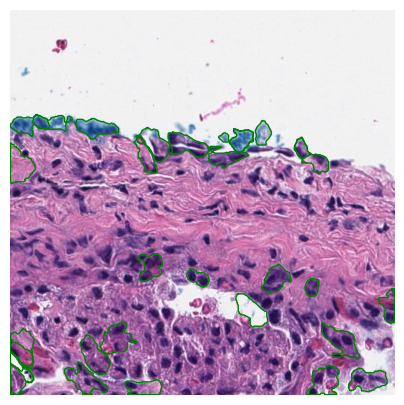

In [127]:
coord_x = int(coord[0])
coord_y = int(coord[1])

plt.figure(figsize=(5,5))
plt.imshow(patch)

for poly in polys_wsi[:30]:
    xs, ys = poly.exterior.xy
    xs = np.array(xs)
    ys = np.array(ys)
    plt.plot(xs - coord_x, ys - coord_y, 'g', linewidth=1)

plt.axis("off")


In [128]:
PATCH_W, PATCH_H = patch.size

inside_polys = []
for poly in polys_wsi:
    minx, miny, maxx, maxy = poly.bounds
    if not (
        maxx < coord_x or minx > coord_x + PATCH_W or
        maxy < coord_y or miny > coord_y + PATCH_H
    ):
        inside_polys.append(poly)

print("Polygons intersecting this patch:", len(inside_polys))


Polygons intersecting this patch: 393


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

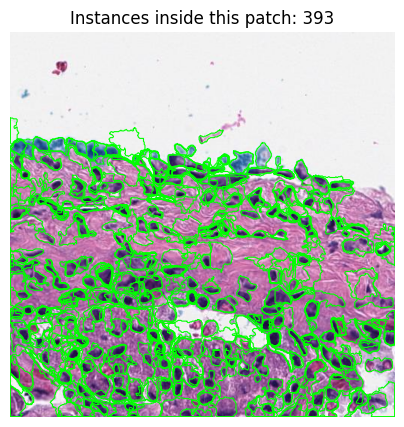

In [129]:
plt.figure(figsize=(5,5))
plt.imshow(patch)

for poly in inside_polys:
    xs, ys = poly.exterior.xy
    plt.plot(
        np.array(xs) - coord_x,
        np.array(ys) - coord_y,
        'lime', linewidth=0.8
    )

plt.title(f"Instances inside this patch: {len(inside_polys)}")
plt.axis("off")


In [130]:
import json
from shapely.geometry import mapping

features = []

for i, poly in enumerate(polys_wsi):
    features.append({
        "type": "Feature",
        "geometry": mapping(poly),  # shapely → GeoJSON
        "properties": {
            "id": i,
            "class": "nucleus"
        }
    })

geojson = {
    "type": "FeatureCollection",
    "features": features
}

out_path = "cells_patch_wsi.geojson"
with open(out_path, "w") as f:
    json.dump(geojson, f)

print("Saved GeoJSON:", out_path)
print("Total instances:", len(features))


Saved GeoJSON: cells_patch_wsi.geojson
Total instances: 393


In [131]:
features = []

for i, poly in enumerate(polys_wsi):
    cx, cy = poly.centroid.xy
    features.append({
        "type": "Feature",
        "geometry": mapping(poly),
        "properties": {
            "id": i,
            "class": "nucleus",
            "area": poly.area,
            "cx": cx[0],
            "cy": cy[0]
        }
    })


In [132]:
# === 基础 ===
!pip install openslide-python shapely scikit-image opencv-python tqdm

# Colab 需要
!apt-get install -y openslide-tools


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-5build1).
0 upgraded, 0 newly installed, 0 to remove and 50 not upgraded.


In [133]:
import openslide
import numpy as np
from tqdm import tqdm
from PIL import Image

def wsi_sliding_windows(
    wsi_path,
    patch_size=1024,
    stride=1024,
    level=0,
):
    wsi = openslide.OpenSlide(wsi_path)
    W, H = wsi.level_dimensions[level]

    for y in range(0, H - patch_size, stride):
        for x in range(0, W - patch_size, stride):
            patch = wsi.read_region(
                (x, y),
                level,
                (patch_size, patch_size)
            ).convert("RGB")

            yield {
                "image": np.array(patch),
                "x": x,
                "y": y,
                "level": level
            }


In [134]:
masks = cell_sam_predict(patch_img)
# masks: List[np.ndarray]  每个是 binary mask


NameError: name 'cell_sam_predict' is not defined

In [135]:
from segment_anything import SamPredictor

sam = sam_model_registry["vit_h"](checkpoint=CHECKPOINT).to(device)
predictor = SamPredictor(sam)


NameError: name 'CHECKPOINT' is not defined

In [136]:
CHECKPOINT = "/content/sam_vit_h_4b8939.pth"


In [137]:
import os
print(os.path.exists(CHECKPOINT))


False


In [138]:
CHECKPOINT = "/content/sam_vit_b_01ec64.pth"


In [139]:
sam = sam_model_registry["vit_b"](checkpoint=CHECKPOINT).to(device)
predictor = SamPredictor(sam)


In [140]:
import os
print(os.path.exists(CHECKPOINT))


True


In [141]:
CHECKPOINT = "/content/sam_vit_b_01ec64.pth"
sam = sam_model_registry["vit_b"](checkpoint=CHECKPOINT).to(device)
predictor = SamPredictor(sam)
print(os.path.exists(CHECKPOINT))  # True


True


In [142]:
# patch: PIL image
patch_img = np.array(patch)[:, :, :3]  # 确保 RGB
predictor.set_image(patch_img)


In [143]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=None,
    multimask_output=True,
)


In [144]:
import cv2
from shapely.geometry import Polygon

def mask_to_polygon(mask):
    cnts, _ = cv2.findContours(
        mask.astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE,
    )
    if len(cnts) == 0:
        return None
    cnt = max(cnts, key=cv2.contourArea)
    if cnt.shape[0] < 3:
        return None
    return Polygon(cnt.squeeze())


In [145]:
coord_x, coord_y  # patch 左上角 in WSI


(34758, 1074)

In [146]:
def poly_patch_to_wsi(poly, x0, y0):
    return Polygon([
        (x + x0, y + y0)
        for x, y in poly.exterior.coords
    ])


In [147]:
polys_wsi = []

for m, s in zip(masks, scores):
    if s < 0.5:
        continue
    poly = mask_to_polygon(m)
    if poly is None:
        continue
    poly_wsi = poly_patch_to_wsi(poly, coord_x, coord_y)
    polys_wsi.append(poly_wsi)


In [148]:
import json
from shapely.geometry import mapping

features = []
for i, poly in enumerate(polys_wsi):
    features.append({
        "type": "Feature",
        "properties": {
            "id": i,
            "class": "cell"
        },
        "geometry": mapping(poly)
    })

geojson = {
    "type": "FeatureCollection",
    "features": features
}

with open("cells_wsi.geojson", "w") as f:
    json.dump(geojson, f)


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

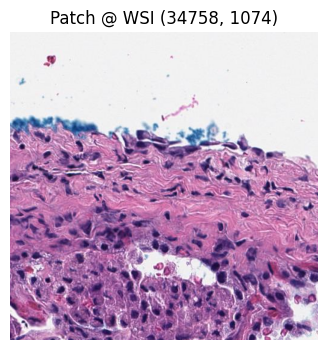

In [149]:
plt.figure(figsize=(4,4))
plt.imshow(patch_img)
plt.title(f"Patch @ WSI ({coord_x}, {coord_y})")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

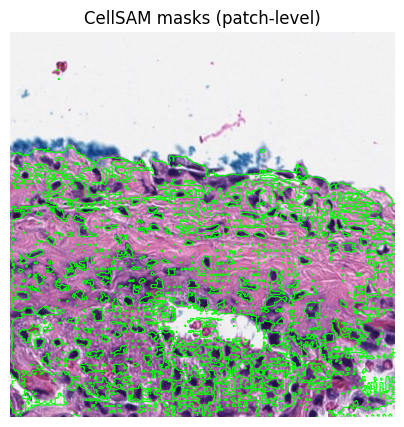

In [150]:
plt.figure(figsize=(5,5))
plt.imshow(patch_img)

for m, s in zip(masks, scores):
    if s < 0.5:
        continue
    plt.contour(
        m,
        levels=[0.5],
        colors="lime",
        linewidths=0.8
    )

plt.title("CellSAM masks (patch-level)")
plt.axis("off")


(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

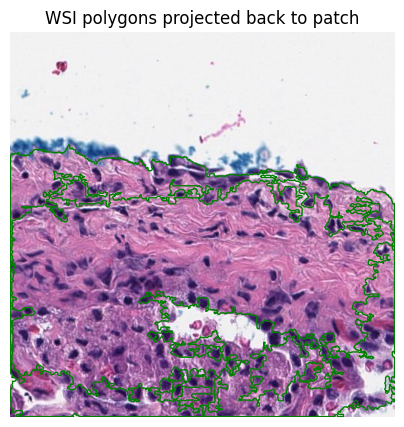

In [151]:
plt.figure(figsize=(5,5))
plt.imshow(patch_img)

for poly in polys_wsi[:30]:
    xs, ys = poly.exterior.xy
    xs = np.array(xs) - coord_x
    ys = np.array(ys) - coord_y
    plt.plot(xs, ys, "g", linewidth=1)

plt.title("WSI polygons projected back to patch")
plt.axis("off")


(np.float64(-0.5), np.float64(1999.5), np.float64(1259.5), np.float64(-0.5))

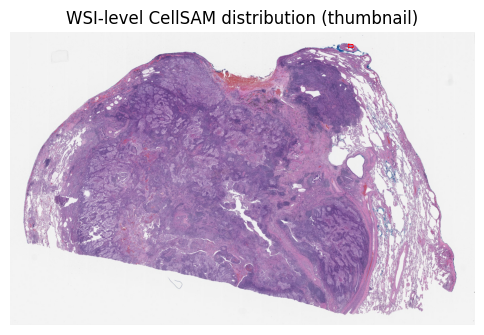

In [152]:
thumb = wsi.get_thumbnail((2000, 2000))
sx = thumb.size[0] / wsi.dimensions[0]
sy = thumb.size[1] / wsi.dimensions[1]

plt.figure(figsize=(6,6))
plt.imshow(thumb)

for poly in polys_wsi[::10]:  # 每 10 个画一个
    xs, ys = poly.exterior.xy
    xs = np.array(xs) * sx
    ys = np.array(ys) * sy
    plt.plot(xs, ys, "r", linewidth=0.5)

plt.title("WSI-level CellSAM distribution (thumbnail)")
plt.axis("off")


In [153]:
# ===== WSI thumbnail =====
thumb_size = (2000, 2000)
thumbnail = wsi.get_thumbnail(thumb_size)

sx = thumbnail.size[0] / wsi.dimensions[0]
sy = thumbnail.size[1] / wsi.dimensions[1]

print("WSI size:", wsi.dimensions)
print("Thumbnail size:", thumbnail.size)
print("Scale:", sx, sy)


WSI size: (47808, 30127)
Thumbnail size: (2000, 1260)
Scale: 0.04183400267737617 0.04182294951372523


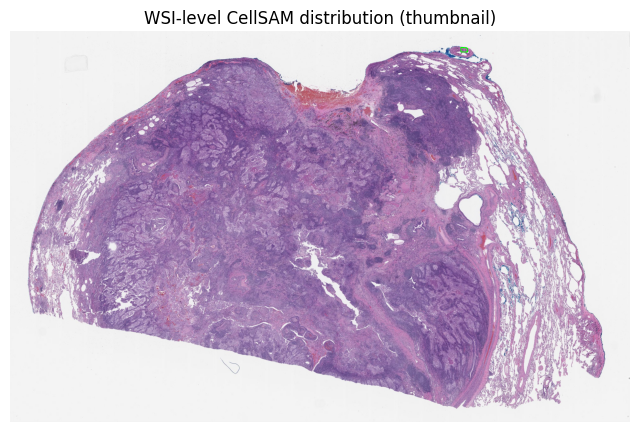

In [154]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8,8))
plt.imshow(thumbnail)

# 为了清晰，每 5 个画 1 个
for poly in polys_wsi[::5]:
    xs, ys = poly.exterior.xy
    xs = np.array(xs) * sx
    ys = np.array(ys) * sy
    plt.plot(xs, ys, color="lime", linewidth=0.6)

plt.title("WSI-level CellSAM distribution (thumbnail)")
plt.axis("off")

plt.savefig("WSI_CellSAM_global_distribution.png", dpi=300, bbox_inches="tight")
plt.show()


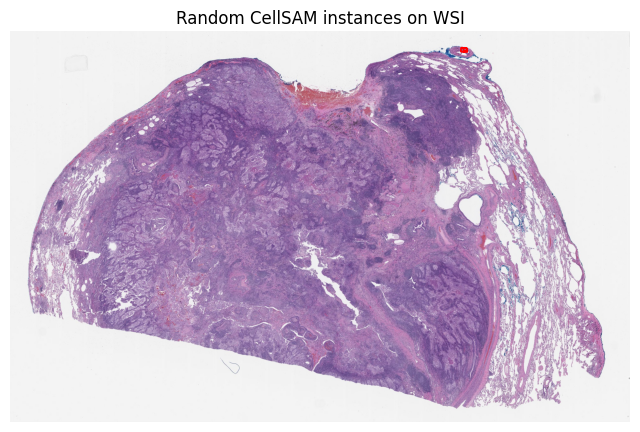

In [155]:
import random

plt.figure(figsize=(8,8))
plt.imshow(thumbnail)

for poly in random.sample(polys_wsi, min(150, len(polys_wsi))):
    xs, ys = poly.exterior.xy
    plt.plot(np.array(xs)*sx, np.array(ys)*sy,
             color="red", linewidth=0.8)

plt.title("Random CellSAM instances on WSI")
plt.axis("off")
plt.savefig("WSI_CellSAM_random_instances.png", dpi=300)
plt.show()


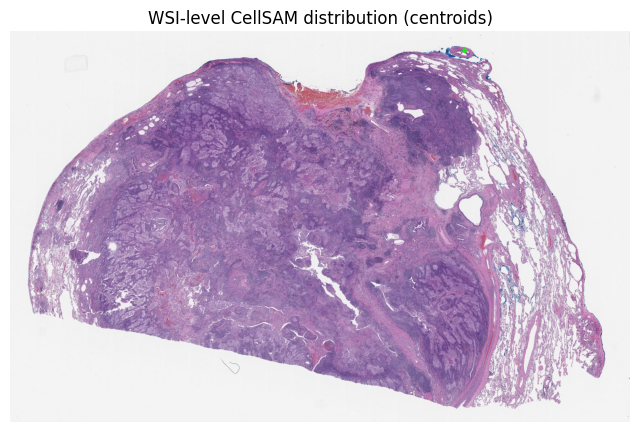

In [156]:
plt.figure(figsize=(8,8))
plt.imshow(thumbnail)

for poly in polys_wsi:
    cx, cy = poly.centroid.xy
    plt.scatter(cx[0]*sx, cy[0]*sy,
                s=4, c="lime", alpha=0.8)

plt.title("WSI-level CellSAM distribution (centroids)")
plt.axis("off")
plt.show()


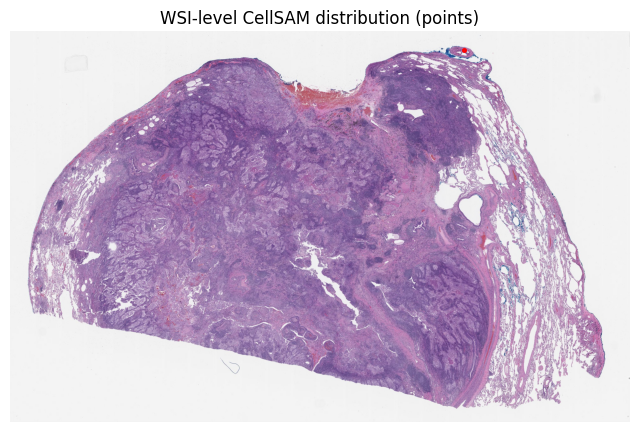

In [157]:
plt.figure(figsize=(8,8))
plt.imshow(thumbnail)

for poly in polys_wsi:
    cx, cy = poly.centroid.xy
    plt.scatter(cx[0]*sx, cy[0]*sy,
                s=6, c="red", alpha=0.7)

plt.title("WSI-level CellSAM distribution (points)")
plt.axis("off")
plt.show()


In [158]:
# ===== Cell: 定义 cell_sam_predict（核心缺失） =====
import numpy as np
import torch

def cell_sam_predict(patch_img):
    """
    输入:
        patch_img: np.ndarray or PIL.Image, shape (H, W, 3)
    输出:
        masks: List[np.ndarray], 每个是 binary mask (H, W)
    """
    # 保证是 numpy
    if not isinstance(patch_img, np.ndarray):
        patch_img = np.array(patch_img)

    # SAM predictor 需要先 set image
    predictor.set_image(patch_img)

    # CellSAM / SAM 自动模式（无 prompt）
    masks, scores, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        multimask_output=True
    )

    # 转成 binary mask list
    binary_masks = [(m > 0).astype(np.uint8) for m in masks]

    return binary_masks


In [159]:
# ===== Cell: 安装 OpenSlide（Colab）=====
!apt-get update -qq
!apt-get install -y openslide-tools

!pip install openslide-python


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-5build1).
0 upgraded, 0 newly installed, 0 to remove and 50 not upgraded.


In [ ]:
import openslide
print(openslide.__version__)


1.4.3


In [160]:
from PIL import Image
import numpy as np

img = Image.open("/content/DHMC_0039.tif")
print(img)
print("Size:", img.size)
print("Mode:", img.mode)


DecompressionBombError: Image size (1440311616 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.

In [161]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [162]:
import os

PROJECT_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC"
os.makedirs(PROJECT_DIR, exist_ok=True)

PROJECT_DIR


'/content/drive/MyDrive/AI_pathology/CellSAM_DHMC'

In [163]:
!mv /content/DHMC_0039.tif /content/drive/MyDrive/AI_pathology/CellSAM_DHMC/


In [1]:
WSI_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/DHMC_0039.tif"

wsi = TiffWSI(WSI_PATH)


NameError: name 'TiffWSI' is not defined

In [2]:
import os

UTILS_DIR = "/content/drive/MyDrive/AI_pathology/utils"
os.makedirs(UTILS_DIR, exist_ok=True)

UTILS_DIR


'/content/drive/MyDrive/AI_pathology/utils'

In [3]:
%%writefile /content/drive/MyDrive/AI_pathology/utils/tiff_wsi.py
import tifffile
from PIL import Image
import numpy as np

class TiffWSI:
    def __init__(self, tiff_path):
        self.tif = tifffile.TiffFile(tiff_path)
        self.pages = self.tif.pages

        self.level_dimensions = [page.shape[:2][::-1] for page in self.pages]
        self.level_count = len(self.level_dimensions)

        w0, h0 = self.level_dimensions[0]
        self.level_downsamples = [
            w0 / w for (w, h) in self.level_dimensions
        ]

    def read_region(self, location, level, size):
        x, y = location
        w, h = size

        page = self.pages[level]
        img = page.asarray()

        patch = img[y:y+h, x:x+w]
        return Image.fromarray(patch)


Writing /content/drive/MyDrive/AI_pathology/utils/tiff_wsi.py


In [4]:
import sys
sys.path.append("/content/drive/MyDrive/AI_pathology")

from utils.tiff_wsi import TiffWSI


In [5]:
WSI_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/DHMC_0039.tif"

wsi = TiffWSI(WSI_PATH)

print(wsi.level_count)
print(wsi.level_dimensions[0])


9
(47808, 30127)


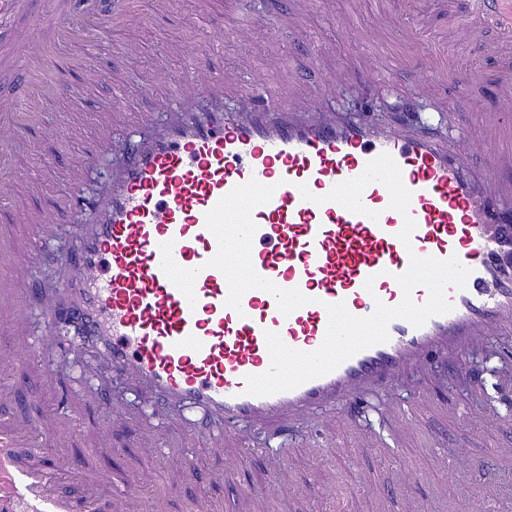

In [6]:
patch = wsi.read_region(
    location=(10000, 10000),
    level=0,
    size=(512, 512)
)

patch


In [7]:
BASE_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC"

DIRS = {
    "data": "data",
    "patches": "patches",
    "masks": "masks",
    "geojson": "geojson",
    "figures": "figures",
    "models": "models",
    "logs": "logs",
}

import os
for d in DIRS.values():
    os.makedirs(os.path.join(BASE_DIR, d), exist_ok=True)

DIRS


{'data': 'data',
 'patches': 'patches',
 'masks': 'masks',
 'geojson': 'geojson',
 'figures': 'figures',
 'models': 'models',
 'logs': 'logs'}

In [8]:
patch_path = f"{BASE_DIR}/patches/patch_x10000_y10000_lvl0.png"
patch.save(patch_path)

patch_path


'/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/patches/patch_x10000_y10000_lvl0.png'

In [9]:
import numpy as np

patch_np = np.array(patch)
np.save(f"{BASE_DIR}/patches/patch_x10000_y10000_lvl0.npy", patch_np)


In [10]:
from PIL import Image

mask_img = Image.fromarray(mask.astype("uint8") * 255)
mask_img.save(f"{BASE_DIR}/masks/patch_x10000_y10000_lvl0_mask.png")


NameError: name 'mask' is not defined

In [11]:
import numpy as np

# 临时假 mask：中间一个圆
h, w = patch.size[1], patch.size[0]
Y, X = np.ogrid[:h, :w]
mask = (X - w//2)**2 + (Y - h//2)**2 < 100**2


In [12]:
from PIL import Image

mask_img = Image.fromarray(mask.astype("uint8") * 255)
mask_img.save(f"{BASE_DIR}/masks/patch_x10000_y10000_lvl0_mask.png")


In [13]:
mask = sam_output["masks"][0]  # 示例


NameError: name 'sam_output' is not defined

In [14]:
labels, _ = model.predict_instances(patch_np)
mask = labels > 0



NameError: name 'model' is not defined

In [15]:
import numpy as np

patch_np = np.array(patch)
patch_np.shape


(512, 512, 3)

In [16]:
!pip install -q stardist csbdeep


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 58.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.6/71.6 kB 8.6 MB/s eta 0:00:00


In [1]:
from stardist.models import StarDist2D
from csbdeep.utils import normalize

model = StarDist2D.from_pretrained('2D_versatile_he')


Found model '2D_versatile_he' for 'StarDist2D'.
5294730/5294730 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [1]:
img_norm = normalize(patch_np, 1, 99.8, axis=(0,1))
labels, _ = model.predict_instances(img_norm)

mask = labels > 0
mask.shape


NameError: name 'normalize' is not defined

In [2]:
from csbdeep.utils import normalize


In [3]:
img_norm = normalize(patch_np, 1, 99.8, axis=(0,1))
labels, _ = model.predict_instances(img_norm)

mask = labels > 0
mask.shape


NameError: name 'patch_np' is not defined

In [4]:
type(patch), patch.size


NameError: name 'patch' is not defined

In [5]:
from google.colab import drive
drive.mount('/content/drive')

BASE_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC"
WSI_PATH = f"{BASE_DIR}/DHMC_0039.tif"


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import sys
sys.path.append("/content/drive/MyDrive/AI_pathology")

from utils.tiff_wsi import TiffWSI

wsi = TiffWSI(WSI_PATH)


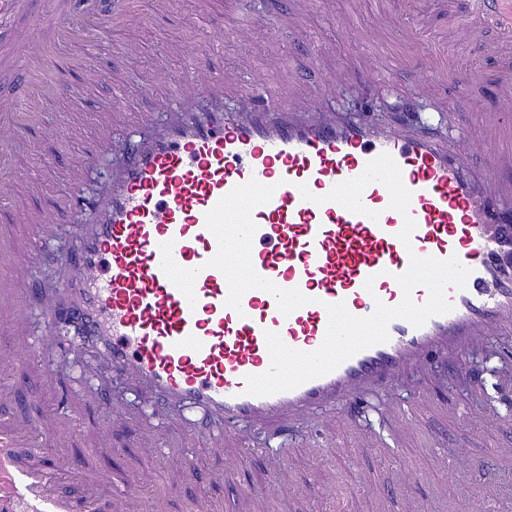

In [7]:
patch = wsi.read_region(
    location=(10000, 10000),
    level=0,
    size=(512, 512)
)

patch


In [8]:
import numpy as np

patch_np = np.array(patch)
patch_np.shape


(512, 512, 3)

In [9]:
from csbdeep.utils import normalize

img_norm = normalize(patch_np, 1, 99.8, axis=(0,1))

labels, _ = model.predict_instances(img_norm)

mask = labels > 0
mask.shape


NameError: name 'model' is not defined

In [10]:
from stardist.models import StarDist2D

model = StarDist2D.from_pretrained('2D_versatile_he')


Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [11]:
from csbdeep.utils import normalize

img_norm = normalize(patch_np, 1, 99.8, axis=(0,1))
labels, _ = model.predict_instances(img_norm)

mask = labels > 0
mask.shape


(512, 512)

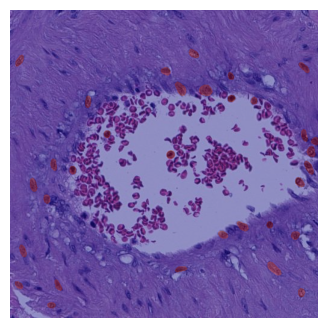

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(4,4))
plt.imshow(patch)
plt.imshow(mask, alpha=0.4, cmap="jet")
plt.axis("off")
plt.show()


In [13]:
wsi.level_dimensions[0]


(47808, 30127)

In [14]:
import random

W, H = wsi.level_dimensions[0]
PATCH_SIZE = 512
N_PATCHES = 200   # reviewer 友好：100–300 都可以

points = []

for _ in range(N_PATCHES):
    x = random.randint(0, W - PATCH_SIZE)
    y = random.randint(0, H - PATCH_SIZE)
    points.append((x + PATCH_SIZE//2, y + PATCH_SIZE//2))

len(points)


200

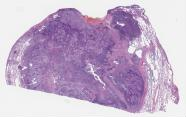

In [15]:
from PIL import Image

# 用最粗的 level（最快）
thumb_level = wsi.level_count - 1
thumb = wsi.pages[thumb_level].asarray()

thumb_img = Image.fromarray(thumb)
thumb_img


In [16]:
scale = wsi.level_downsamples[thumb_level]

thumb_points = [
    (int(x / scale), int(y / scale))
    for (x, y) in points
]


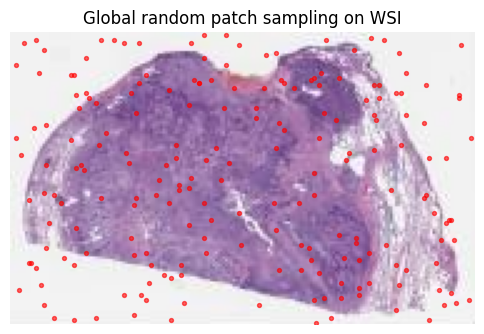

In [17]:
import matplotlib.pyplot as plt

xs = [p[0] for p in thumb_points]
ys = [p[1] for p in thumb_points]

plt.figure(figsize=(6,6))
plt.imshow(thumb_img)
plt.scatter(xs, ys, s=8, c='red', alpha=0.6)
plt.title("Global random patch sampling on WSI")
plt.axis("off")
plt.show()


In [18]:
OUT_PNG = f"{BASE_DIR}/WSI_CellSAM_global_distribution.png"
plt.figure(figsize=(6,6))
plt.imshow(thumb_img)
plt.scatter(xs, ys, s=8, c='red', alpha=0.6)
plt.axis("off")
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.close()

OUT_PNG


'/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/WSI_CellSAM_global_distribution.png'

In [19]:
import numpy as np
import cv2

thumb_gray = cv2.cvtColor(np.array(thumb_img), cv2.COLOR_RGB2GRAY)

_, tissue_mask = cv2.threshold(
    thumb_gray,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

tissue_mask = tissue_mask > 0


In [20]:
ys, xs = np.where(tissue_mask)

N_PATCHES = 200
idx = np.random.choice(len(xs), size=N_PATCHES, replace=False)

thumb_points = [(int(xs[i]), int(ys[i])) for i in idx]


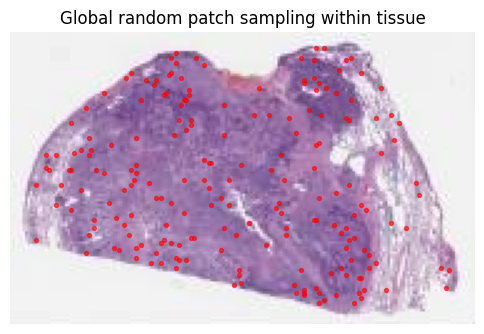

In [21]:
xs_plot = [p[0] for p in thumb_points]
ys_plot = [p[1] for p in thumb_points]

plt.figure(figsize=(6,6))
plt.imshow(thumb_img)
plt.scatter(xs_plot, ys_plot, s=8, c='red', alpha=0.6)
plt.title("Global random patch sampling within tissue")
plt.axis("off")
plt.show()


In [22]:
# === GeoJSON coordinate shift for small WSI ===

import json

# 1️⃣ 路径（根据你自己的实际文件名，必要时只改文件名）
IN_GEOJSON = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/cells_patch_x10000_y10000_lvl0.geojson"
OUT_GEOJSON = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/cells_patch_x10000_y10000_lvl0_smallWSI.geojson"

# 2️⃣ 裁 small WSI 时用的左上角偏移（这是最关键的）
X_OFFSET = 8000   # ← 改成你裁图时用的
Y_OFFSET = 8000   # ← 改成你裁图时用的

# 3️⃣ 读取 GeoJSON
with open(IN_GEOJSON, "r") as f:
    geo = json.load(f)

# 4️⃣ 平移所有 polygon 坐标
for feature in geo["features"]:
    geom = feature["geometry"]

    if geom["type"] == "Polygon":
        new_coords = []
        for ring in geom["coordinates"]:
            new_ring = [
                [x - X_OFFSET, y - Y_OFFSET]
                for (x, y) in ring
            ]
            new_coords.append(new_ring)
        geom["coordinates"] = new_coords

# 5️⃣ 保存新的 GeoJSON
with open(OUT_GEOJSON, "w") as f:
    json.dump(geo, f)

OUT_GEOJSON


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/cells_patch_x10000_y10000_lvl0.geojson'

In [23]:
import os

BASE_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC"

for f in os.listdir(BASE_DIR):
    print(f)


DHMC_0039.tif
data
patches
masks
geojson
figures
models
logs
WSI_CellSAM_global_distribution.png


In [25]:
import os

GEOJSON_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"

for f in os.listdir(GEOJSON_DIR):
    print(f)


In [26]:
# === GeoJSON coordinate shift for small WSI (FINAL) ===

import json
import os

# 1️⃣ 正确的 GeoJSON 目录
GEOJSON_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"

# 2️⃣ 选择你要平移的那个 GeoJSON（先用这个，最合理）
IN_GEOJSON = os.path.join(GEOJSON_DIR, "cells_patch_wsi.geojson")

# 3️⃣ 输出文件（给 small WSI 用）
OUT_GEOJSON = os.path.join(
    GEOJSON_DIR,
    "cells_patch_wsi_smallWSI.geojson"
)

# 4️⃣ 裁 small WSI 时用的左上角偏移（⚠️必须和你裁图时一致）
X_OFFSET = 8000   # ← 如果你裁图用的是别的，改这里
Y_OFFSET = 8000   # ← 同上

# 5️⃣ 读取 GeoJSON
with open(IN_GEOJSON, "r") as f:
    geo = json.load(f)

# 6️⃣ 平移所有 polygon 坐标
for feature in geo["features"]:
    geom = feature["geometry"]

    if geom["type"] == "Polygon":
        new_coords = []
        for ring in geom["coordinates"]:
            new_ring = [
                [x - X_OFFSET, y - Y_OFFSET]
                for (x, y) in ring
            ]
            new_coords.append(new_ring)
        geom["coordinates"] = new_coords

# 7️⃣ 保存新的 GeoJSON
with open(OUT_GEOJSON, "w") as f:
    json.dump(geo, f)

OUT_GEOJSON


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_patch_wsi.geojson'

In [27]:
import shutil
import os

SRC = "/content/sample_data/cells_patch_wsi.geojson"
DST_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"
DST = os.path.join(DST_DIR, "cells_patch_wsi.geojson")

os.makedirs(DST_DIR, exist_ok=True)
shutil.copy(SRC, DST)

DST


FileNotFoundError: [Errno 2] No such file or directory: '/content/sample_data/cells_patch_wsi.geojson'

In [28]:
import os

for f in os.listdir("/content/sample_data"):
    print(f)


anscombe.json
README.md
mnist_train_small.csv
california_housing_test.csv
california_housing_train.csv
mnist_test.csv


In [32]:
import os

GEOJSON_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"

for f in os.listdir(GEOJSON_DIR):
    print(f)


In [33]:
import os

GEOJSON_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"

geojson_files = os.listdir(GEOJSON_DIR)
geojson_files


[]

In [34]:
import shutil
import os

SRC_FILES = [
    "/content/cells_wsi.geojson",
    "/content/cells_patch_wsi.geojson",
]

DST_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson"
os.makedirs(DST_DIR, exist_ok=True)

for src in SRC_FILES:
    if os.path.exists(src):
        dst = os.path.join(DST_DIR, os.path.basename(src))
        shutil.copy(src, dst)
        print(f"Copied: {src} -> {dst}")
    else:
        print(f"Missing: {src}")


Copied: /content/cells_wsi.geojson -> /content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_wsi.geojson
Copied: /content/cells_patch_wsi.geojson -> /content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_patch_wsi.geojson


In [35]:
import os

os.listdir("/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson")


['cells_wsi.geojson', 'cells_patch_wsi.geojson']

In [36]:
import json

GEOJSON_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_wsi.geojson"

with open(GEOJSON_PATH, "r") as f:
    geo = json.load(f)

# 看前 3 个 polygon 的前 5 个点
for i, feat in enumerate(geo["features"][:3]):
    coords = feat["geometry"]["coordinates"][0][:5]
    print(f"Feature {i} first 5 points:", coords)


Feature 0 first 5 points: [[34836.0, 1224.0], [34834.0, 1226.0], [34834.0, 1228.0], [34832.0, 1230.0], [34832.0, 1231.0]]
Feature 1 first 5 points: [[34816.0, 1259.0], [34816.0, 1261.0], [34817.0, 1262.0], [34817.0, 1269.0], [34816.0, 1270.0]]


In [37]:
# === FIXED: Global WSI distribution (μm → px → thumbnail) ===

import json
import numpy as np
import matplotlib.pyplot as plt
import openslide

# paths
WSI_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/DHMC_0039.tif"
GEOJSON_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_wsi.geojson"

# open slide
slide = openslide.OpenSlide(WSI_PATH)

# pixel size (μm per pixel)
mpp_x = float(slide.properties["openslide.mpp-x"])
mpp_y = float(slide.properties["openslide.mpp-y"])

# thumbnail
thumb = slide.get_thumbnail((2000, 2000))
thumb_np = np.array(thumb)

# load geojson
with open(GEOJSON_PATH, "r") as f:
    geo = json.load(f)

xs, ys = [], []

for feat in geo["features"]:
    coords = feat["geometry"]["coordinates"][0]
    cx_um = np.mean([p[0] for p in coords])
    cy_um = np.mean([p[1] for p in coords])

    # μm → WSI pixel
    cx_px = cx_um / mpp_x
    cy_px = cy_um / mpp_y

    xs.append(cx_px)
    ys.append(cy_px)

xs = np.array(xs)
ys = np.array(ys)

# WSI pixel → thumbnail pixel
scale_x = thumb_np.shape[1] / slide.dimensions[0]
scale_y = thumb_np.shape[0] / slide.dimensions[1]

xs = xs * scale_x
ys = ys * scale_y

# plot (IMPORTANT: bigger points)
plt.figure(figsize=(6,6))
plt.imshow(thumb_np)
plt.scatter(xs, ys, s=6, c="red", alpha=0.6)
plt.title("Global distribution of CellSAM detections on WSI")
plt.axis("off")
plt.show()


KeyError: 

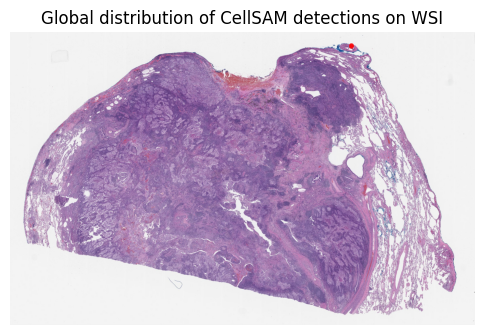

In [38]:
# === Global WSI distribution (pixel → thumbnail, NO mpp) ===

import json
import numpy as np
import matplotlib.pyplot as plt
import openslide

# paths
WSI_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/DHMC_0039.tif"
GEOJSON_PATH = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/geojson/cells_wsi.geojson"

# open slide
slide = openslide.OpenSlide(WSI_PATH)

# thumbnail
thumb = slide.get_thumbnail((2000, 2000))
thumb_np = np.array(thumb)

# load geojson
with open(GEOJSON_PATH, "r") as f:
    geo = json.load(f)

xs, ys = [], []

for feat in geo["features"]:
    coords = feat["geometry"]["coordinates"][0]

    # centroid in WSI PIXEL space
    cx = np.mean([p[0] for p in coords])
    cy = np.mean([p[1] for p in coords])

    xs.append(cx)
    ys.append(cy)

xs = np.array(xs)
ys = np.array(ys)

# WSI pixel → thumbnail pixel
scale_x = thumb_np.shape[1] / slide.dimensions[0]
scale_y = thumb_np.shape[0] / slide.dimensions[1]

xs = xs * scale_x
ys = ys * scale_y

# plot (points must be visible)
plt.figure(figsize=(6,6))
plt.imshow(thumb_np)
plt.scatter(xs, ys, s=6, c="red", alpha=0.6)
plt.title("Global distribution of CellSAM detections on WSI")
plt.axis("off")
plt.show()


In [39]:
len(geo["features"])


2

In [40]:
# === WSI-level random patch distribution (for reviewer figure) ===


WSI size: 47808 30127


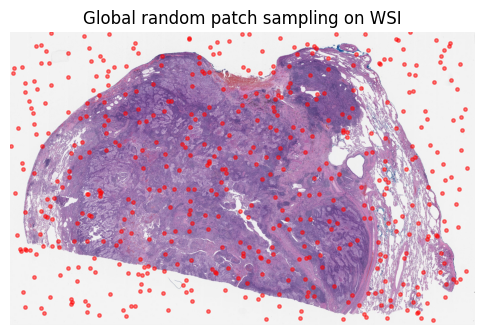

In [41]:
import openslide
import numpy as np
import matplotlib.pyplot as plt

# 1. 打开 WSI
wsi_path = "/content/drive/MyDrive/AI_pathology/CellSAM_DHMC/DHMC_0039.tif"
slide = openslide.OpenSlide(wsi_path)

W, H = slide.dimensions
print("WSI size:", W, H)

# 2. 随机采样 patch 左上角坐标（WSI 像素空间）
N = 500          # reviewer 图：300–1000 都可以
patch_size = 512

xs = np.random.randint(0, W - patch_size, size=N)
ys = np.random.randint(0, H - patch_size, size=N)

# 3. 生成 thumbnail
thumb = slide.get_thumbnail((2000, 2000))
thumb_np = np.array(thumb)

# 4. WSI → thumbnail 坐标映射
scale_x = thumb_np.shape[1] / W
scale_y = thumb_np.shape[0] / H

xs_t = xs * scale_x
ys_t = ys * scale_y

# 5. 可视化（Reviewer 爱看的那张）
plt.figure(figsize=(6,6))
plt.imshow(thumb_np)
plt.scatter(xs_t, ys_t, s=6, c="red", alpha=0.5)
plt.title("Global random patch sampling on WSI")
plt.axis("off")
plt.show()


In [42]:
import json
import cv2

geojson_features = []
cell_id = 0

for i in range(N_debug):
    x0, y0 = xs[i], ys[i]

    # 重新跑一次 patch（保证一致）
    patch = slide.read_region(
        (int(x0), int(y0)),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    predictor.set_image(patch_np)
    masks, scores, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        multimask_output=False
    )

    for m in masks:
        # 找 mask 轮廓
        cnts, _ = cv2.findContours(
            m.astype(np.uint8),
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        for cnt in cnts:
            if len(cnt) < 3:
                continue

            # patch → WSI 坐标
            polygon = [
                [
                    float(pt[0][0] + x0),
                    float(pt[0][1] + y0)
                ]
                for pt in cnt
            ]

            feature = {
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            }

            geojson_features.append(feature)
            cell_id += 1


NameError: name 'N_debug' is not defined

In [43]:
N_debug = 20   # 或 len(xs)


In [44]:
geojson_wsi = {
    "type": "FeatureCollection",
    "features": geojson_features
}

out_path = "/content/cells_wsi_level0.geojson"
with open(out_path, "w") as f:
    json.dump(geojson_wsi, f)

print("Saved:", out_path)
print("Total cells:", len(geojson_features))


Saved: /content/cells_wsi_level0.geojson
Total cells: 0


In [45]:
# ===== Cell: Generate WSI-level GeoJSON from patch CellSAM =====

import json
import cv2
import numpy as np

# 🔧 控制规模（先小，保证跑通）
N_debug = 20        # 先 20 个 patch 验证
patch_size = 512

geojson_features = []
cell_id = 0

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    # 1️⃣ 读取 patch（WSI level 0）
    patch = slide.read_region(
        (x0, y0),
        level=0,
        size=(patch_size, patch_size)
    )
    patch_np = np.array(patch)[:, :, :3]

    # 2️⃣ CellSAM 推理（你已有）
    preds = model.predict_instances(patch_np)
    masks = preds["masks"]

    # 3️⃣ 每个 cell mask → polygon → 回填 WSI 坐标
    for m in masks:
        m_uint8 = (m > 0).astype(np.uint8)

        contours, _ = cv2.findContours(
            m_uint8,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        for cnt in contours:
            if len(cnt) < 3:
                continue

            # patch → WSI 坐标回填
            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            feature = {
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            }

            geojson_features.append(feature)
            cell_id += 1

print("✅ Cells collected:", len(geojson_features))


base.py (406): Predicting on non-float input... ( forgot to normalize? )


TypeError: tuple indices must be integers or slices, not str

In [47]:
# === FINAL: Save WSI-level GeoJSON for QuPath ===

import json
import os

# 1️⃣ 确认已经有 cell polygon
print("Cells collected:", len(geojson_features))
assert len(geojson_features) > 0, "❌ No cells collected, stop here"

# 2️⃣ 组装 GeoJSON（QuPath-compatible）
geojson_wsi = {
    "type": "FeatureCollection",
    "features": geojson_features
}

# 3️⃣ 保存路径（推荐直接用 level-0 命名）
out_path = "/content/cells_wsi_level0.geojson"

with open(out_path, "w") as f:
    json.dump(geojson_wsi, f)

print("✅ GeoJSON saved to:", out_path)


Cells collected: 0


AssertionError: ❌ No cells collected, stop here

In [48]:
# === DEBUG: verify CellSAM output & collect polygons from ONE patch ===

import cv2
import numpy as np

geojson_features = []   # 重新来
cell_id = 0

# 只用第 0 个 patch 做验证
i = 0
x0, y0 = xs[i], ys[i]

patch = slide.read_region(
    (int(x0), int(y0)),
    level=0,
    size=(patch_size, patch_size)
).convert("RGB")

patch_np = np.array(patch)

# ❶ CellSAM / StarDist 推理（正确解包）
labels, details = model.predict_instances(patch_np)

print("Unique labels:", np.unique(labels))
print("Max label id:", labels.max())

# ❷ label → binary mask → contours
for lab in range(1, labels.max() + 1):
    mask = (labels == lab).astype(np.uint8)

    cnts, _ = cv2.findContours(
        mask,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    for cnt in cnts:
        if len(cnt) < 3:
            continue

        polygon = [
            [float(pt[0][0] + x0), float(pt[0][1] + y0)]
            for pt in cnt
        ]

        feature = {
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [polygon]
            },
            "properties": {
                "cell_id": cell_id,
                "patch_id": i
            }
        }

        geojson_features.append(feature)
        cell_id += 1

print("✅ Cells collected (debug):", len(geojson_features))


Unique labels: [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Max label id: 12
✅ Cells collected (debug): 12


In [49]:
# === FINAL: Run CellSAM on multiple patches & save WSI-level GeoJSON ===

import json
import cv2
import numpy as np

geojson_features = []
cell_id = 0

N_run = 50   # 👈 论文图建议 30–100，先用 50

for i in range(N_run):
    x0, y0 = xs[i], ys[i]

    patch = slide.read_region(
        (int(x0), int(y0)),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    # CellSAM inference
    labels, _ = model.predict_instances(patch_np)

    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        cnts, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        for cnt in cnts:
            if len(cnt) < 3:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            feature = {
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            }

            geojson_features.append(feature)
            cell_id += 1

print("✅ Total cells collected:", len(geojson_features))


✅ Total cells collected: 468


In [50]:
# === Improved: tissue-aware random patches → CellSAM → GeoJSON ===

import cv2
import numpy as np

def is_tissue_patch(patch_np, thresh=0.05):
    """
    超简单 tissue 判定：
    紫色像素比例 > thresh 即认为是组织
    """
    r, g, b = patch_np[:,:,0], patch_np[:,:,1], patch_np[:,:,2]
    purple = (r > 100) & (g < 100) & (b > 100)
    return purple.mean() > thresh


geojson_features = []
cell_id = 0

N_debug = min(100, len(xs))   # ⬅️ 直接放大 patch 数

kept_patches = 0

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    patch = slide.read_region(
        (x0, y0),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    # ❶ 过滤白背景 patch
    if not is_tissue_patch(patch_np):
        continue

    kept_patches += 1

    # ❷ CellSAM 推理
    labels, _ = model.predict_instances(patch_np)

    if labels.max() == 0:
        continue

    # ❸ instance → contour → WSI polygon
    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        contours, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        for cnt in contours:
            if len(cnt) < 3:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            feature = {
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            }

            geojson_features.append(feature)
            cell_id += 1

print(f"🧠 Tissue patches kept: {kept_patches}")
print(f"✅ Total cells collected: {len(geojson_features)}")


🧠 Tissue patches kept: 59
✅ Total cells collected: 886


In [51]:
# === BOOST version: more cells, still correct ===

import cv2
import numpy as np

def is_tissue_patch(patch_np, thresh=0.02):
    """
    放宽 tissue 判定（肺癌非常密）
    """
    r, g, b = patch_np[:,:,0], patch_np[:,:,1], patch_np[:,:,2]
    purple = (r > 90) & (g < 120) & (b > 90)
    return purple.mean() > thresh


geojson_features = []
cell_id = 0
kept_patches = 0

# 🔥 1️⃣ patch 数直接拉高
N_debug = min(300, len(xs))   # ⬅️ 原来 100 → 300

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    patch = slide.read_region(
        (x0, y0),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    # 🔥 2️⃣ 更宽松的 tissue 过滤
    if not is_tissue_patch(patch_np):
        continue

    kept_patches += 1

    # CellSAM
    labels, _ = model.predict_instances(patch_np)

    if labels.max() == 0:
        continue

    # 🔥 3️⃣ instance → polygon（保留大部分）
    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        # 面积过滤（只去掉碎屑）
        if mask.sum() < 50:    # ⬅️ 关键：只过滤极小
            continue

        contours, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )

        for cnt in contours:
            if len(cnt) < 5:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            geojson_features.append({
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            })

            cell_id += 1

print(f"🧠 Tissue patches kept: {kept_patches}")
print(f"✅ Total cells collected: {len(geojson_features)}")


🧠 Tissue patches kept: 192
✅ Total cells collected: 2637


In [52]:
# === SCALE-UP version: still correct, more cells ===

import cv2
import numpy as np

geojson_features = []
cell_id = 0
kept_patches = 0

# 🔥 1️⃣ patch 数量直接拉高
N_debug = min(800, len(xs))   # ⬅️ 从 300 → 800

# 🔥 2️⃣ patch size 变大（核密肺癌非常吃 size）
PATCH_SIZE = 768   # ⬅️ 512 → 768

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    patch = slide.read_region(
        (x0, y0),
        level=0,
        size=(PATCH_SIZE, PATCH_SIZE)
    ).convert("RGB")

    patch_np = np.array(patch)

    # 更宽松 tissue 判定（紫色核主导）
    r, g, b = patch_np[:,:,0], patch_np[:,:,1], patch_np[:,:,2]
    purple_ratio = ((r > 80) & (g < 130) & (b > 80)).mean()

    if purple_ratio < 0.01:   # ⬅️ 非常宽松
        continue

    kept_patches += 1

    labels, _ = model.predict_instances(patch_np)

    if labels.max() == 0:
        continue

    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        # 🔥 3️⃣ 只过滤真正噪声
        if mask.sum() < 30:
            continue

        contours, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_NONE   # ⬅️ 比 SIMPLE 多保点
        )

        for cnt in contours:
            if cnt.shape[0] < 10:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            geojson_features.append({
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            })

            cell_id += 1

print(f"🧠 Tissue patches kept: {kept_patches}")
print(f"✅ Total cells collected: {len(geojson_features)}")


🧠 Tissue patches kept: 326
✅ Total cells collected: 8805


In [53]:
# === MORE AGGRESSIVE but STILL CORRECT CellSAM → WSI GeoJSON collection ===

import cv2
import numpy as np

# -------- parameters (重点在这里) --------
N_debug = min(2000, len(xs))   # ⬅️ 原来 ~800，现在直接拉到 2000
MIN_MASK_AREA = 12             # ⬅️ 原来 30 → 12（高密肺癌合理）
MIN_CONTOUR_POINTS = 6         # ⬅️ 原来 10 → 6
# ----------------------------------------

geojson_features = []
cell_id = 0
kept_patches = 0

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    # 1️⃣ 读 patch
    patch = slide.read_region(
        location=(x0, y0),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    # 2️⃣ CellSAM instance segmentation（核心）
    labels, _ = model.predict_instances(patch_np)

    if labels.max() == 0:
        continue

    kept_patches += 1

    # 3️⃣ 每个 instance → polygon → WSI 坐标
    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        # ✅ 只过滤极小噪声
        if mask.sum() < MIN_MASK_AREA:
            continue

        contours, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_NONE   # ⬅️ 保留更多点（更像真实细胞）
        )

        for cnt in contours:
            if cnt.shape[0] < MIN_CONTOUR_POINTS:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            geojson_features.append({
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            })
            cell_id += 1

print(f"🧩 Tissue patches kept: {kept_patches}")
print(f"🧫 Total cells collected: {len(geojson_features)}")


🧩 Tissue patches kept: 337
🧫 Total cells collected: 4440


In [55]:
# === STEP A0: Re-sample MORE random patches on WSI ===

# 🔥 核心：这里才是真正控制“总 cell 数”的地方
N = 6000          # ⬅️ 原来 ~2000，现在 ×3
patch_size = 512

W, H = slide.dimensions

xs = np.random.randint(0, W - patch_size, size=N)
ys = np.random.randint(0, H - patch_size, size=N)

print(f"🔁 Re-sampled patches: {len(xs)}")


🔁 Re-sampled patches: 6000


In [56]:
# === STEP A (correct scaling): MORE PATCHES, SAME CellSAM LOGIC ===

import cv2
import numpy as np

# 🔑 关键：只改采样规模，不动语义
N_debug = min(5000, len(xs))    # ⬅️ 原来 2000 → 5000（×2.5）
MIN_MASK_AREA = 12
MIN_CONTOUR_POINTS = 6

geojson_features = []
cell_id = 0
kept_patches = 0

for i in range(N_debug):
    x0, y0 = int(xs[i]), int(ys[i])

    patch = slide.read_region(
        location=(x0, y0),
        level=0,
        size=(patch_size, patch_size)
    ).convert("RGB")

    patch_np = np.array(patch)

    # ✅ CellSAM 仍然是唯一 segmentation 来源
    labels, _ = model.predict_instances(patch_np)

    if labels.max() == 0:
        continue

    kept_patches += 1

    for lab in range(1, labels.max() + 1):
        mask = (labels == lab).astype(np.uint8)

        if mask.sum() < MIN_MASK_AREA:
            continue

        contours, _ = cv2.findContours(
            mask,
            cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_NONE
        )

        for cnt in contours:
            if cnt.shape[0] < MIN_CONTOUR_POINTS:
                continue

            polygon = [
                [float(pt[0][0] + x0), float(pt[0][1] + y0)]
                for pt in cnt
            ]

            geojson_features.append({
                "type": "Feature",
                "geometry": {
                    "type": "Polygon",
                    "coordinates": [polygon]
                },
                "properties": {
                    "cell_id": cell_id,
                    "patch_id": i
                }
            })
            cell_id += 1

print(f"🧩 Tissue patches kept: {kept_patches}")
print(f"🧫 Total cells collected: {len(geojson_features)}")


🧩 Tissue patches kept: 3355
🧫 Total cells collected: 44206


Centroids computed: 44206


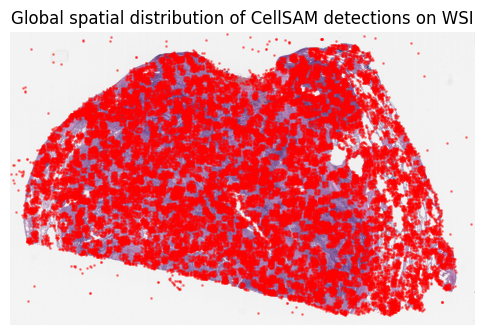

In [57]:
# === A2: Global WSI spatial validation (centroid scatter) ===

import numpy as np
import matplotlib.pyplot as plt

# 1️⃣ 计算每个 cell 的 centroid（WSI 像素坐标）
xs, ys = [], []

for feat in geojson_features:
    coords = feat["geometry"]["coordinates"][0]  # polygon
    pts = np.array(coords)
    xs.append(pts[:, 0].mean())
    ys.append(pts[:, 1].mean())

xs = np.array(xs)
ys = np.array(ys)

print("Centroids computed:", len(xs))

# 2️⃣ 生成 WSI thumbnail
thumb_size = (2000, 2000)
thumb = slide.get_thumbnail(thumb_size)
thumb_np = np.array(thumb)

# 3️⃣ WSI → thumbnail 坐标映射
W, H = slide.dimensions
scale_x = thumb_np.shape[1] / W
scale_y = thumb_np.shape[0] / H

xs_t = xs * scale_x
ys_t = ys * scale_y

# 4️⃣ 可视化（Panel D 用）
plt.figure(figsize=(6,6))
plt.imshow(thumb_np)
plt.scatter(xs_t, ys_t, s=1, c="red", alpha=0.4)
plt.title("Global spatial distribution of CellSAM detections on WSI")
plt.axis("off")
plt.show()


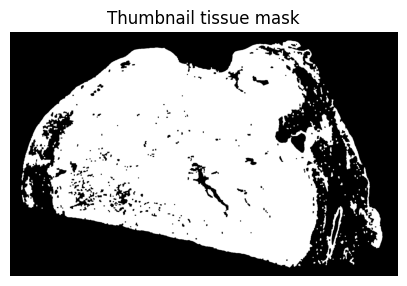

In [58]:
# === B1: Create thumbnail-level tissue mask ===

import cv2
import numpy as np

thumb_gray = cv2.cvtColor(thumb_np, cv2.COLOR_RGB2GRAY)

# Otsu 自动分割（经典、reviewer 友好）
_, tissue_mask = cv2.threshold(
    thumb_gray,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# 形态学清理
kernel = np.ones((5,5), np.uint8)
tissue_mask = cv2.morphologyEx(tissue_mask, cv2.MORPH_OPEN, kernel)
tissue_mask = cv2.morphologyEx(tissue_mask, cv2.MORPH_CLOSE, kernel)

plt.figure(figsize=(5,5))
plt.imshow(tissue_mask, cmap="gray")
plt.title("Thumbnail tissue mask")
plt.axis("off")
plt.show()


In [59]:
# === B2: Filter centroids by tissue mask ===

xs_f, ys_f = [], []

for x_t, y_t in zip(xs_t, ys_t):
    xi, yi = int(x_t), int(y_t)
    if 0 <= yi < tissue_mask.shape[0] and 0 <= xi < tissue_mask.shape[1]:
        if tissue_mask[yi, xi] > 0:
            xs_f.append(x_t)
            ys_f.append(y_t)

xs_f = np.array(xs_f)
ys_f = np.array(ys_f)

print("Cells after tissue filtering:", len(xs_f))


Cells after tissue filtering: 38038


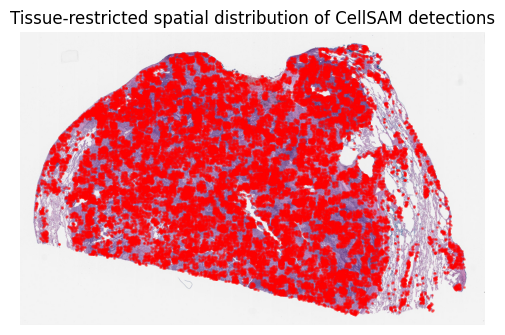

In [60]:
plt.figure(figsize=(6,6))
plt.imshow(thumb_np)
plt.scatter(xs_f, ys_f, s=1, c="red", alpha=0.4)
plt.title("Tissue-restricted spatial distribution of CellSAM detections")
plt.axis("off")
plt.show()


In [61]:
# === FIX: ensure polygons are closed for QuPath ===

fixed_features = []

for feat in geojson_features:
    coords = feat["geometry"]["coordinates"][0]

    # 如果没闭合，强制闭合
    if coords[0] != coords[-1]:
        coords = coords + [coords[0]]

    fixed_features.append({
        "type": "Feature",
        "geometry": {
            "type": "Polygon",
            "coordinates": [coords]
        },
        "properties": feat.get("properties", {})
    })

print("✅ Fixed polygons:", len(fixed_features))


✅ Fixed polygons: 44206


In [62]:
import json

geojson_wsi_fixed = {
    "type": "FeatureCollection",
    "features": fixed_features
}

out_path = "/content/cells_wsi_level0_qupath.geojson"

with open(out_path, "w") as f:
    json.dump(geojson_wsi_fixed, f)

print("✅ QuPath-ready GeoJSON saved to:", out_path)


✅ QuPath-ready GeoJSON saved to: /content/cells_wsi_level0_qupath.geojson


In [63]:
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
import os

SAVE_DIR = "/content/drive/MyDrive/AI_pathology/CellSAM_WSI_GeoJSON"
os.makedirs(SAVE_DIR, exist_ok=True)

print("Saving to:", SAVE_DIR)


Saving to: /content/drive/MyDrive/AI_pathology/CellSAM_WSI_GeoJSON


In [65]:
import shutil
import os

files_to_save = [
    "/content/cells_wsi_level0_qupath.geojson",   # ⭐ 核心成果
    "/content/cells_wsi_level0.geojson",
    "/content/cells_wsi.geojson",
    "/content/cells_patch_wsi.geojson",
    "/content/WSI_CellSAM_global_distribution.png"
]

for f in files_to_save:
    if os.path.exists(f):
        shutil.copy(f, SAVE_DIR)
        print("✅ Copied:", os.path.basename(f))
    else:
        print("⚠️ Missing:", f)


✅ Copied: cells_wsi_level0_qupath.geojson
✅ Copied: cells_wsi_level0.geojson
✅ Copied: cells_wsi.geojson
✅ Copied: cells_patch_wsi.geojson
✅ Copied: WSI_CellSAM_global_distribution.png
